# HeLa & NIH3T3 annotation priotization evaluation

Data from [SpaceM publication](https://www.nature.com/articles/s41592-021-01198-0).

LC-MS data from [Metabolights](https://www.ebi.ac.uk/metabolights/MTBLS78/files). Reprocessed by Bernie.

In [1]:
import random
from typing import Dict
import re
import pickle
import random

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from tqdm import tqdm
from sklearn.metrics.pairwise import pairwise_kernels
import scipy

import scanpy as sc
import linex2 as lx2
import linex2metaspace as lx2m

plt.rcParams['figure.figsize'] = [9, 8]
plt.rcParams['figure.dpi'] = 300
%load_ext autoreload
%autoreload 2

**TODO**: Replace all zeros in a well if all values are zero

* Should be straight forward by checking each well and replacing the values in the 'well' cm dict
* Then merging the well cm dicts to condition well dicts

## Helper Functions

In [2]:
def get_all_conditions(adata, col):
    return list(set(adata.obs[col]))

def get_condition_matrices(adata, col, conditions):
    out_dict = {}
    for cond in conditions:
        out_dict[cond] = adata.X[adata.obs[col] == cond, :]
    return out_dict

def log10_condition_matrices(cond_dict, offset=0):
    return {k: np.log10(v+offset) for k, v in cond_dict.items()}

def mean_condition_matrices(cond_dict):
    return {k: np.nanmean(v, axis=0) for k, v in cond_dict.items()}

def logfc_condition_matrices(cond_dict, c1, c2):
    return cond_dict[c1] - cond_dict[c2]

def nudge(pos, x_shift, y_shift):
    return {n:(x + x_shift, y + (y_shift * np.random.choice([-1,1]))) for n,(x,y) in pos.items()}

def match_lipid(x, pattern=r'^PC'):
    try:
        return bool(re.search(pattern, x))
    except:
        return False

def match_lipids(x, pattern=r'^PC'):
    if x is not np.nan:
        if len(x) > 1:
            try:
                return match_lipid(x[0], pattern) or match_lipid(x[1], pattern)
            except:
                return False
        else:
            return match_lipid(x[0], pattern)
    else:
        return False

def lipid_bubble_plot(likelilipids: pd.Series,
                      condition1: str,
                      condition2: str,
                      reference_lipids,
                      condition_data_dict: Dict[str, np.array],
                      regex_pattern: str = r'\([0-9]+'
                     ):
    position_dict = {}

    for i in tqdm(range(len(likelilipids))):
        if likelilipids[i] is not np.nan:
            if match_lipid(likelilipids[i][0], pattern=regex_pattern):
                tmp = lx2.lipid_parser(likelilipids[i][0], reference_lipids=reference_lipids)
                tk = (tmp.sum_length(), tmp.sum_dbs())
                if tk in position_dict.keys():
                    position_dict[tk].append(i)
                else:
                    position_dict[tk] = [i]
            elif match_lipid(likelilipids[i][1], pattern=regex_pattern):
                tmp = lx2.lipid_parser(likelilipids[i][1], reference_lipids=reference_lipids)
                tk = (tmp.sum_length(), tmp.sum_dbs())
                if tk in position_dict.keys():
                    position_dict[tk].append(i)
                else:
                    position_dict[tk] = [i]

    mean_dict_c1 = {}          
    for k, v in position_dict.items():
        mean_dict_c1[k] = condition_data_dict[condition1][:, v].sum(axis=1).mean()
    mean_dict_c2 = {}
    for k, v in position_dict.items():
        mean_dict_c2[k] = condition_data_dict[condition2][:, v].sum(axis=1).mean()

    df1 = pd.DataFrame(mean_dict_c1.items()).rename(columns={0:'Pos', 1: 'C1'})
    df1['C'] = df1['Pos'].apply(lambda x: x[0])
    df1['DB'] = df1['Pos'].apply(lambda x: x[1])
    df2 = pd.DataFrame(mean_dict_c2.items()).rename(columns={0:'Pos', 1: 'C2'})
    df2['C'] = df2['Pos'].apply(lambda x: x[0])
    df2['DB'] = df2['Pos'].apply(lambda x: x[1])
    final_df = pd.concat([df1.set_index(['C', 'DB']).drop(columns=['Pos']), 
                          df2.set_index(['C', 'DB']).drop(columns=['Pos'])], axis=1).reset_index()
    final_df['LogFC'] = final_df['C1'] - final_df['C2']
    final_df['|LogFC|'] = abs(final_df['C1'] - final_df['C2'])
    
    return final_df

# Test if even chain lenghts are scoring higher on average
def iseven(num):
    return (num % 2) == 0

def scaling_position(x, positions):
    if positions==1:
        return 0
    else:
        return x/(positions-1)

def get_ranking_dict(net):
    out_dict = {}

    # K - ion, V - data
    for k, v in dict(net.nodes(data=True)).items():
        sum_species = v['sum_species']
        # Get exemplary lipids for each sum species
        tmp_dict = {}
        for pos, ss, score in zip(range(len(sum_species)), sum_species.index, sum_species.values):
            # find a matching lipid
            for ll in v['parsed_lipids']:
                if ll.sum_species_str() == ss:
                    break
            # Include only actually ranked lipids
            if not (sum_species==0).all():
                tmp_dict[ss] = {
                    'relpos': scaling_position(pos, len(sum_species)), # FIX SCALING OF POSITIONS
                    'abspos': pos,
                    'score': score,
                    'lipid': ll,
                    'iseven': iseven(ll.sum_length()),
                    'hasether': ll.get_ether()
                               }
        out_dict[k] = tmp_dict
    
    return out_dict

## Compose AnnData

In [3]:
sc_tab = pd.read_csv('data/hela_nih3t3/spaceM_source_data.csv') \
    .rename(columns={'Cell type label (HeLa, 0; NIH3T3, 1)': 'celltype'})

sc_tab['celltype'] = sc_tab['celltype'].apply(lambda x: 'Hela' if x==0 else 'NIH3T3')

<AxesSubplot: xlabel='UMAP X', ylabel='UMAP Y'>

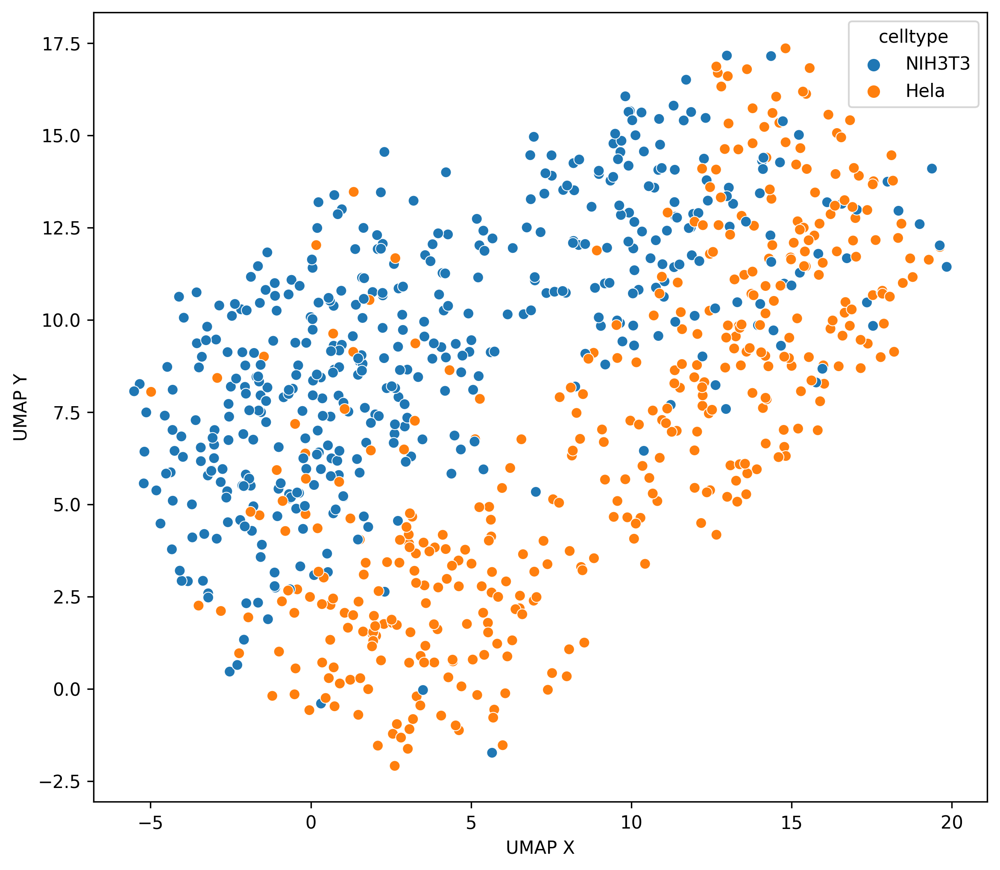

In [4]:
sns.scatterplot(sc_tab, x='UMAP X', y='UMAP Y', hue='celltype')

In [5]:
sc_tab.columns = [x.split(' - ')[0] for x in sc_tab.columns]

In [6]:
obs = sc_tab[['Cell Index', 'UMAP X', 'UMAP Y', 'celltype']]

In [7]:
#sm = SMInstance()
#ds = sm.dataset(id='2018-05-29_11h23m47s')
#annotations = ds.results(database=26)
#pickle.dump(annotations, open('data/hela_nih3t3/sm_results_2018-05-29_11h23m47s.pickle', 'wb'))
annotations = pickle.load(open('data/hela_nih3t3/sm_results_2018-05-29_11h23m47s.pickle', 'rb'))
#annotations = annotations.reset_index().set_index('ion')

In [8]:
tmp = list(annotations.reset_index().set_index('formula').index)
mapped_metabolites = []
for x in list(sc_tab.drop(columns=['Cell Index', 'UMAP X', 'UMAP Y', 'celltype']).columns):
    if x in tmp:
        mapped_metabolites.append(x)

In [9]:
matrx = np.array(sc_tab.drop(columns=['Cell Index', 'UMAP X', 'UMAP Y', 'celltype']))
f"{str(len(mapped_metabolites))} of {matrx.shape[1]} metabolites were successfully mapped" 

'75 of 88 metabolites were successfully mapped'

In [10]:
adata = sc.AnnData(
    X=np.array(sc_tab.drop(columns=['Cell Index', 'UMAP X', 
                                    'UMAP Y', 'celltype']).loc[:,mapped_metabolites], dtype='float32'),
    obs=obs,
    var=annotations.loc[mapped_metabolites, :]
)


/home/trose/anaconda3/envs/metabolomics/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [11]:
adata

AnnData object with n_obs × n_vars = 846 × 75
    obs: 'Cell Index', 'UMAP X', 'UMAP Y', 'celltype'
    var: 'ionFormula', 'ion', 'mz', 'msm', 'rhoSpatial', 'rhoSpectral', 'moc', 'fdr', 'offSample', 'isotopeImages', 'colocCoeff', 'moleculeNames', 'moleculeIds', 'intensity'

In [12]:
feature_sim = pd.DataFrame(pairwise_kernels(adata.X.transpose(), metric='cosine'))
feature_sim.columns = adata.var.index
feature_sim.index = adata.var.index

In [13]:
feature_sim.loc[('C18H32O2', '-H'), ('C19H37O7P', '-H')]

0.61945474

# Compute network

In [14]:
# LINEX2 preprocessing

ref_lip_dict = lx2m.get_lx2_ref_lip_dict()

class_reacs = lx2m.get_organism_combined_class_reactions(ref_lip_dict=ref_lip_dict, organism='HSA')

In [15]:
annotations = adata.var
parsed_lipids = lx2m.parse_annotation_series(annotations['moleculeNames'], ref_lip_dict)
keep_annotations = lx2m.annotations_parsed_lipids(parsed_lipids)
parsed_annotations = annotations.copy()
parsed_annotations['parsed_lipids'] = parsed_lipids
parsed_annotations = parsed_annotations.loc[keep_annotations,:]

Could not parse: '16:1(6Z)'
Could not parse: '16:1(9Z)'
Could not parse: '(6Z,9Z)-octadecadienoate'
Could not parse: '18:2(9Z,11E)'
Could not parse: 'Linoleate'
Could not parse: 'Oleate'
Could not parse: '(9E)-octadecenoate'
Could not parse: '18:1(11E)'
Could not parse: '18:1(11Z)'
Could not parse: '18:1(6Z)'
Could not parse: 'Stearate'
Could not parse: '1-hexadecanoylglycerone 3-phosphate'
Could not parse: 'Timnodate'
Could not parse: '(2E,6E,10E)-geranylgeranate'
Could not parse: '20:4(8Z,11Z,14Z,17Z)'
Could not parse: 'Arachidonate'
Could not parse: '(2E,6E,10E)-omega-hydroxy-geranylgeraniol'
Could not parse: '20:3(8Z,11Z,14Z)'
Could not parse: '20:3(11Z,14Z,17Z)'
Could not parse: '(5Z,8Z,11Z)-eicosatrienoate'
Could not parse: '1-O-(9Z,12Z,15Z)-octadecatrienylglycerone 3-phosphate'
Could not parse: '1-O-(9Z,12Z)-octadecadienylglycerone 3-phosphate'
Could not parse: '1-O-(9Z)-octadecenylglycerone 3-phosphate'
Could not parse: '1-octadecanoylglycerone 3-phosphate'
Could not parse: 'GP

In [16]:
bootstraps = 50

g = lx2m.bootstrap_networks(
        lx2m.unique_sum_species(parsed_annotations['parsed_lipids']),
        parsed_annotations['parsed_lipids'],
        n=bootstraps,
        lx2_class_reacs=class_reacs,
        lx2_reference_lipids=lx2m.get_lx2_ref_lips(),
        return_composed=True
    )

# ig = lx2m.ion_weight_graph(g, 
#                            lx2m.unique_sum_species(parsed_annotations['parsed_lipids']), 
#                            bootstraps=bootstraps,
#                            parsed_lipids=parsed_annotations['parsed_lipids']
#                           )

1 / 50
2 / 50
3 / 50
4 / 50
5 / 50
6 / 50
7 / 50
8 / 50
9 / 50
10 / 50
11 / 50
12 / 50
13 / 50
14 / 50
15 / 50
16 / 50
17 / 50
18 / 50
19 / 50
20 / 50
21 / 50
22 / 50
23 / 50
24 / 50
25 / 50
26 / 50
27 / 50
28 / 50
29 / 50
30 / 50
31 / 50
32 / 50
33 / 50
34 / 50
35 / 50
36 / 50
37 / 50
38 / 50
39 / 50
40 / 50
41 / 50
42 / 50
43 / 50
44 / 50
45 / 50
46 / 50
47 / 50
48 / 50
49 / 50
50 / 50


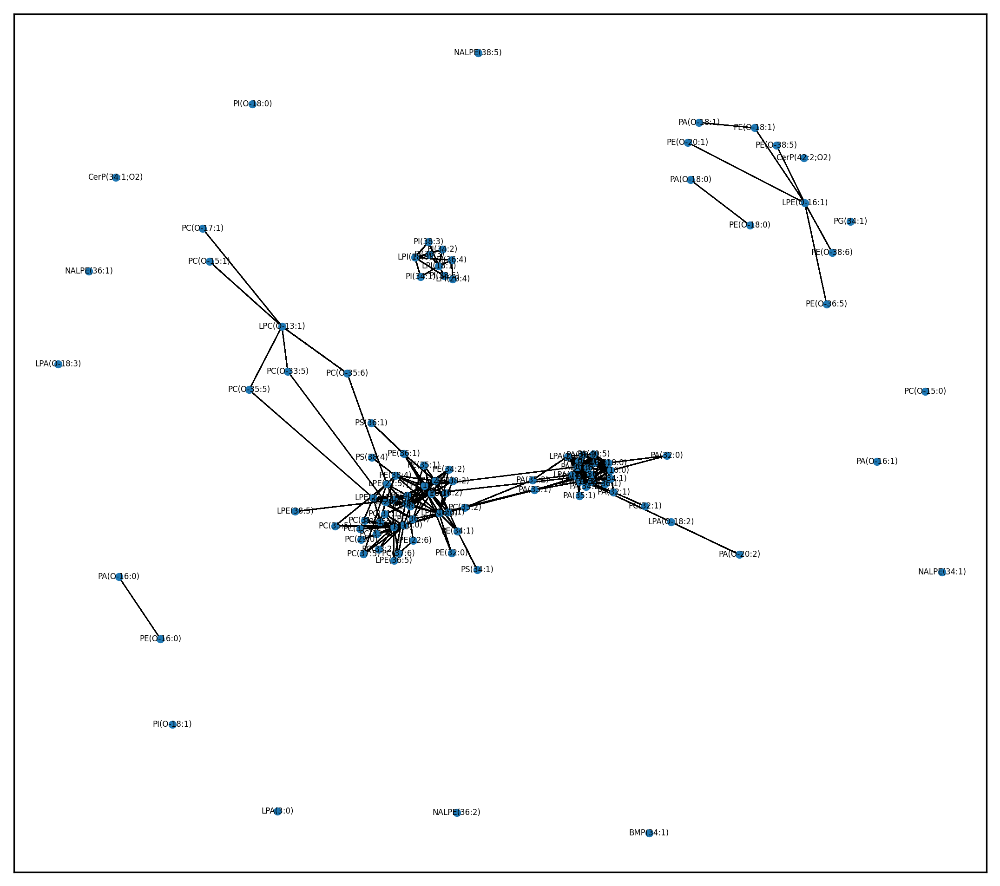

In [17]:
pos = nx.spring_layout(g, k=.8)

nx.draw_networkx_nodes(g, pos=pos, node_size=10)
nx.draw_networkx_edges(g, pos=pos, width=.5)
nx.draw_networkx_labels(g, pos=pos, font_size=4)
plt.show()

In [18]:
ig = lx2m.ion_weight_graph(g, 
                           lx2m.unique_sum_species(parsed_annotations['parsed_lipids']), 
                           bootstraps=bootstraps,
                           parsed_lipids=parsed_annotations['parsed_lipids'],
                           #feature_similarity=feature_sim
                          )

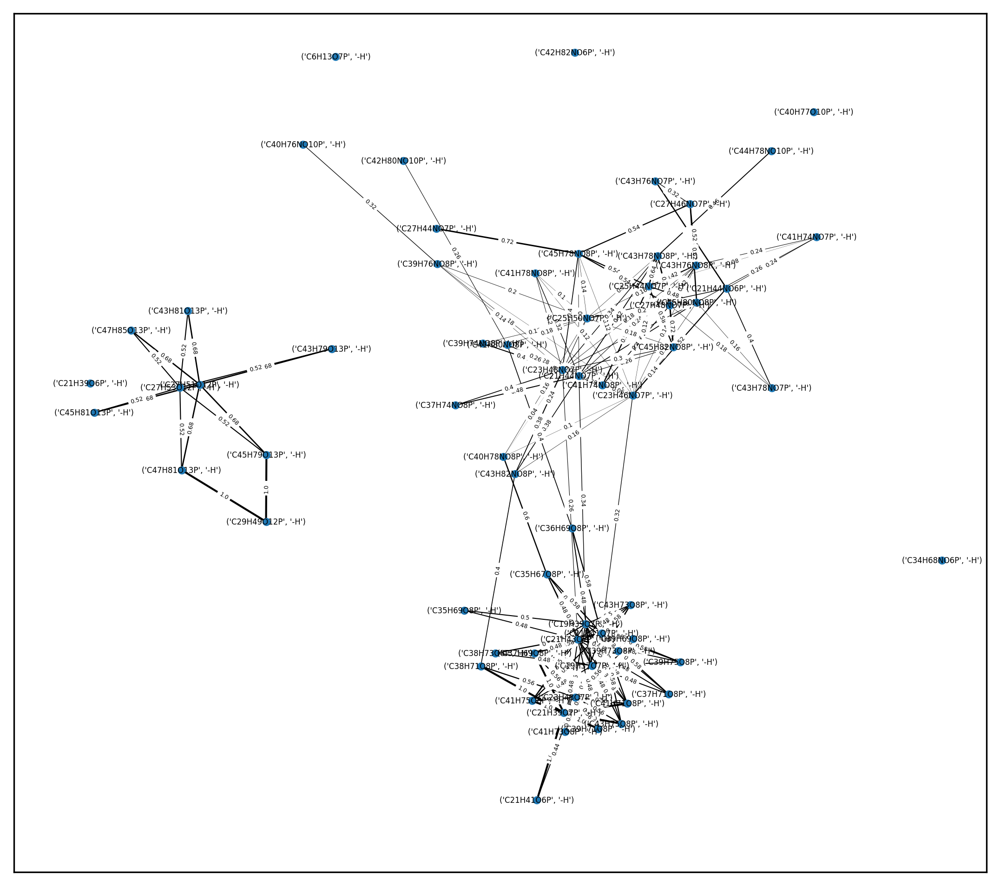

In [19]:
pos = nx.spring_layout(ig, k=.3)

nx.draw_networkx_nodes(ig, pos=pos, node_size=10)
nx.draw_networkx_edges(ig, pos=pos, width=[d['weight'] for u, v, d in ig.edges(data=True)])
nx.draw_networkx_edge_labels(ig, 
                             pos=pos, 
                             edge_labels={(u, v): round(d['weight'], 2) for u, v, d in ig.edges(data=True)}, 
                             font_size=3)
nx.draw_networkx_labels(ig, pos=pos, font_size=4)
plt.show()

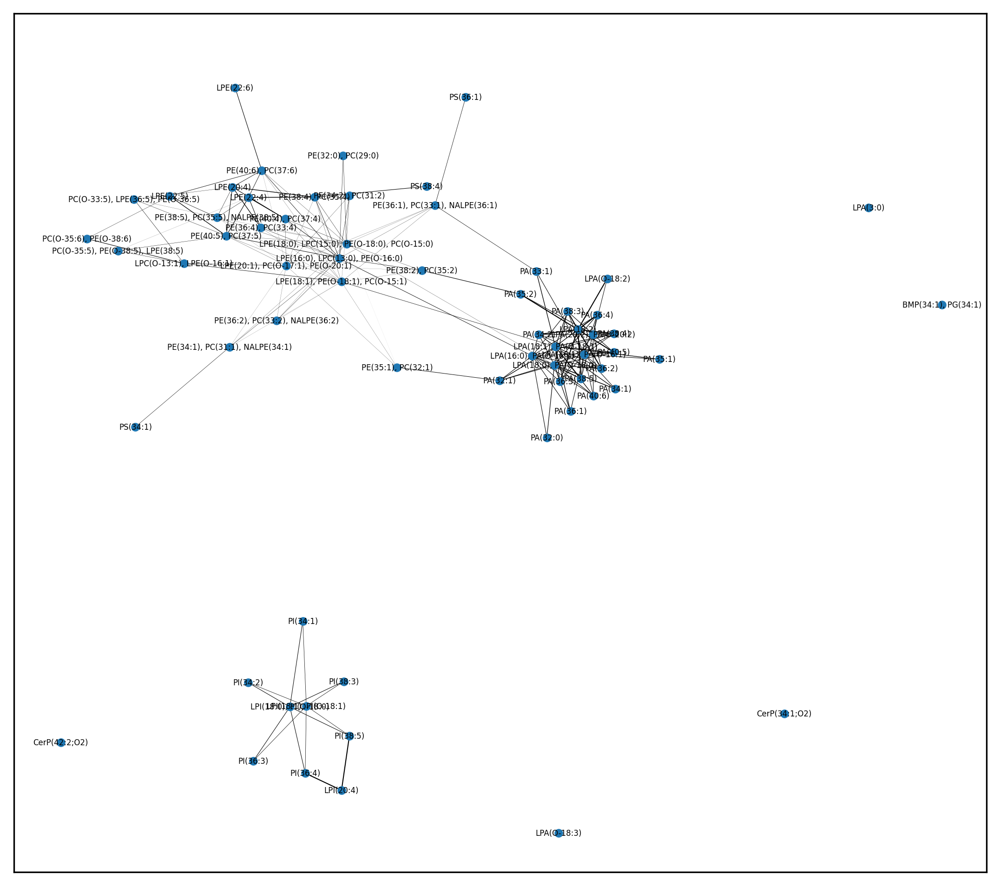

In [20]:
pos = nx.spring_layout(ig, k=.19)
nx.draw_networkx_nodes(ig, pos=pos, node_size=12, )
nx.draw_networkx_edges(ig, pos=pos, width=[d['weight']/2 for u, v, d in ig.edges(data=True)])
#nx.draw_networkx_edge_labels(ig, 
#                             pos=pos, 
#                             edge_labels={(u, v): round(d['weight'], 2) for u, v, d in ig.edges(data=True)}, 
#                             font_size=4)
nx.draw_networkx_labels(ig, pos=pos,
                        labels={k: ", ".join(v['sum_species'].index) for k, v in dict(ig.nodes(data=True)).items()},
                        font_size=4)
plt.show()

### Multiple networks

In [21]:
list(range(10, 51, 10))

[10, 20, 30, 40, 50]

In [22]:
ig_evaluation_dict = {}
# Evaluate a range of number of bootstraps
for bt in tqdm(range(10, 51, 10)):
    
    ig_evaluation_dict[bt] = []
    # 10 Repetitions per number of bootstraps
    for i in range(10):
        tmp_g = lx2m.bootstrap_networks(
                    lx2m.unique_sum_species(parsed_annotations['parsed_lipids']),
                    parsed_annotations['parsed_lipids'],
                    n=bt,
                    lx2_class_reacs=class_reacs,
                    lx2_reference_lipids=lx2m.get_lx2_ref_lips(),
                    return_composed=True,
                    print_iterations=False
                )

        tmp_ig = lx2m.ion_weight_graph(
                    tmp_g, 
                    lx2m.unique_sum_species(parsed_annotations['parsed_lipids']), 
                    bootstraps=bt,
                    parsed_lipids=parsed_annotations['parsed_lipids'],
                    #feature_similarity=feature_sim
                 )
        
        ig_evaluation_dict[bt].append(tmp_ig)

100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [10:58<00:00, 131.78s/it]


## Weighted network

In [29]:
ig_sim = lx2m.ion_weight_graph(g, 
                           lx2m.unique_sum_species(parsed_annotations['parsed_lipids']), 
                           bootstraps=bootstraps,
                           parsed_lipids=parsed_annotations['parsed_lipids'],
                           feature_similarity=feature_sim
                          )

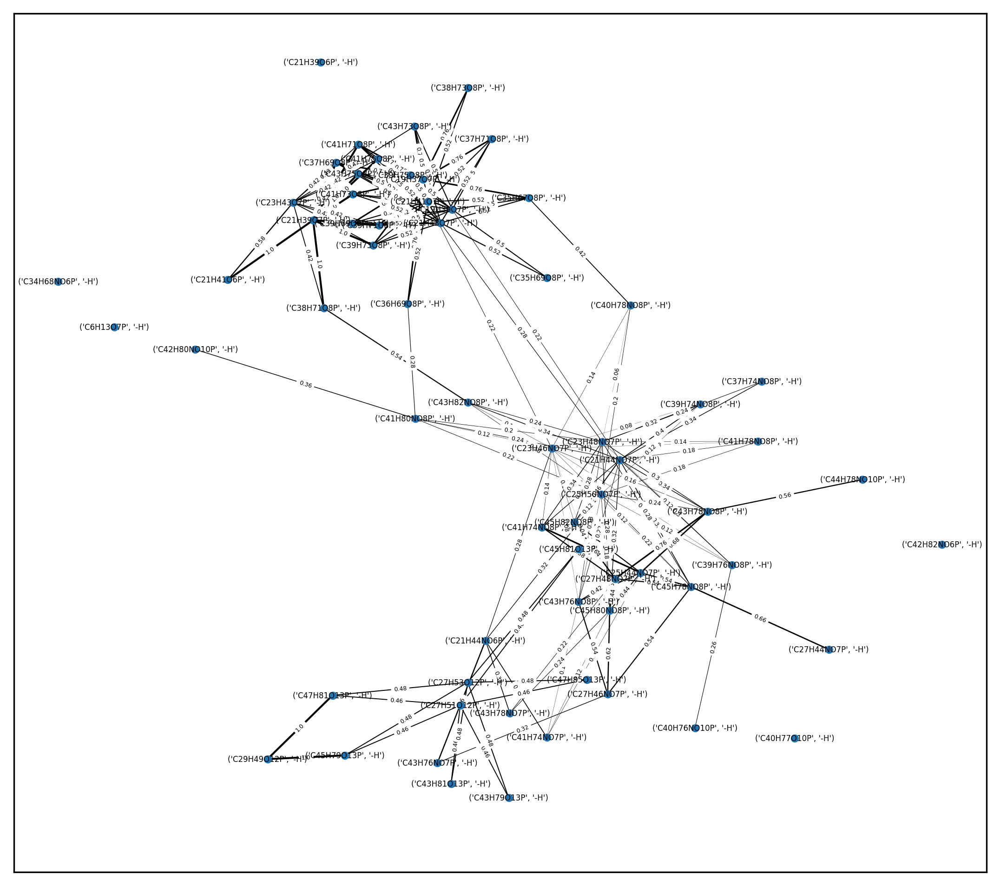

In [26]:
pos = nx.spring_layout(ig_sim, k=.3)

nx.draw_networkx_nodes(ig_sim, pos=pos, node_size=10)
nx.draw_networkx_edges(ig_sim, pos=pos, width=[d['weight'] for u, v, d in ig_sim.edges(data=True)])
nx.draw_networkx_edge_labels(ig_sim, 
                             pos=pos, 
                             edge_labels={(u, v): round(d['weight'], 2) for u, v, d in ig_sim.edges(data=True)}, 
                             font_size=3)
nx.draw_networkx_labels(ig_sim, pos=pos, font_size=4)
plt.show()

In [35]:
list(ig_sim.nodes())[0][0]

'C19H37O7P'

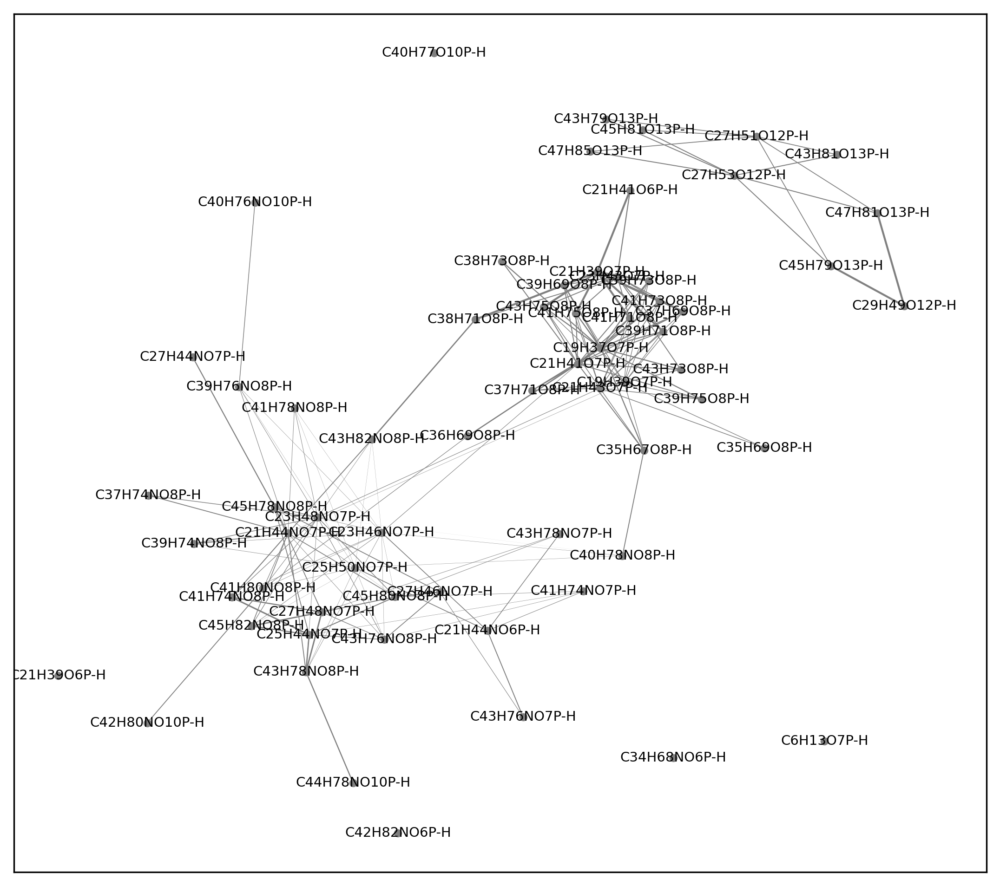

In [45]:
pos = nx.spring_layout(ig_sim, k=.3)

nx.draw_networkx_nodes(ig_sim, pos=pos, node_size=10, node_color='grey')
nx.draw_networkx_edges(ig_sim, pos=pos, width=[d['weight'] for u, v, d in ig_sim.edges(data=True)], edge_color='grey')
#nx.draw_networkx_edge_labels(ig_sim, 
#                             pos=pos, 
#                             edge_labels={(u, v): round(d['weight'], 2) for u, v, d in ig_sim.edges(data=True)}, 
#                             font_size=3)
nx.draw_networkx_labels(ig_sim, labels = {x: x[0]+x[1] for x in ig_sim.nodes()}, pos=pos, font_size=7)
plt.show()

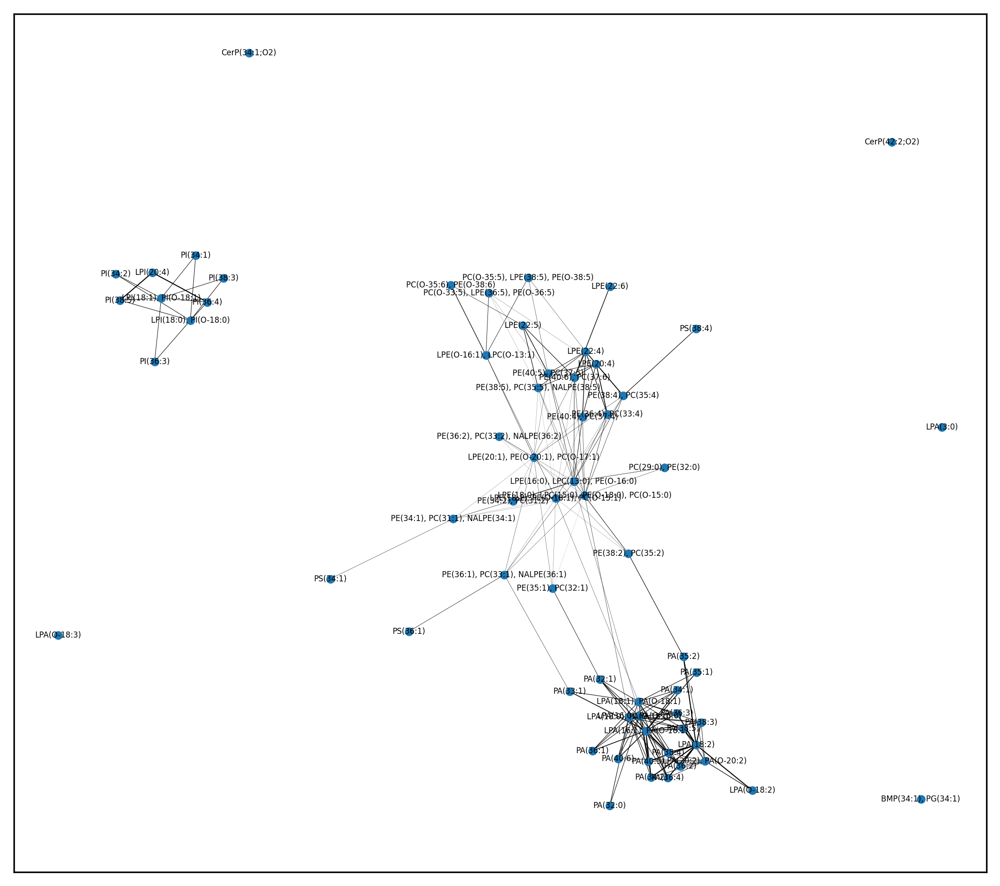

In [27]:
pos = nx.spring_layout(ig_sim, k=.19)
nx.draw_networkx_nodes(ig_sim, pos=pos, node_size=12, )
nx.draw_networkx_edges(ig_sim, pos=pos, width=[d['weight']/2 for u, v, d in ig_sim.edges(data=True)])
#nx.draw_networkx_edge_labels(ig, 
#                             pos=pos, 
#                             edge_labels={(u, v): round(d['weight'], 2) for u, v, d in ig.edges(data=True)}, 
#                             font_size=4)
nx.draw_networkx_labels(ig_sim, pos=pos,
                        labels={k: ", ".join(v['sum_species'].index) for k, v in dict(ig_sim.nodes(data=True)).items()},
                        font_size=4)
plt.show()

### Multiple networks

In [27]:
igw_evaluation_dict = {}
# Evaluate a range of number of bootstraps
for bt in tqdm(range(10, 51, 10)):
    
    igw_evaluation_dict[bt] = []
    # 10 Repetitions per number of bootstraps
    for i in range(10):
        tmp_g = lx2m.bootstrap_networks(
                    lx2m.unique_sum_species(parsed_annotations['parsed_lipids']),
                    parsed_annotations['parsed_lipids'],
                    n=bt,
                    lx2_class_reacs=class_reacs,
                    lx2_reference_lipids=lx2m.get_lx2_ref_lips(),
                    return_composed=True,
                    print_iterations=False
                )

        tmp_ig = lx2m.ion_weight_graph(
                    tmp_g, 
                    lx2m.unique_sum_species(parsed_annotations['parsed_lipids']), 
                    bootstraps=bt,
                    parsed_lipids=parsed_annotations['parsed_lipids'],
                    feature_similarity=feature_sim
                 )
        
        igw_evaluation_dict[bt].append(tmp_ig)

100%|████████████████████████████████████████████████| 5/5 [12:13<00:00, 146.64s/it]


# Single-cell data Statistics

## Network statistics

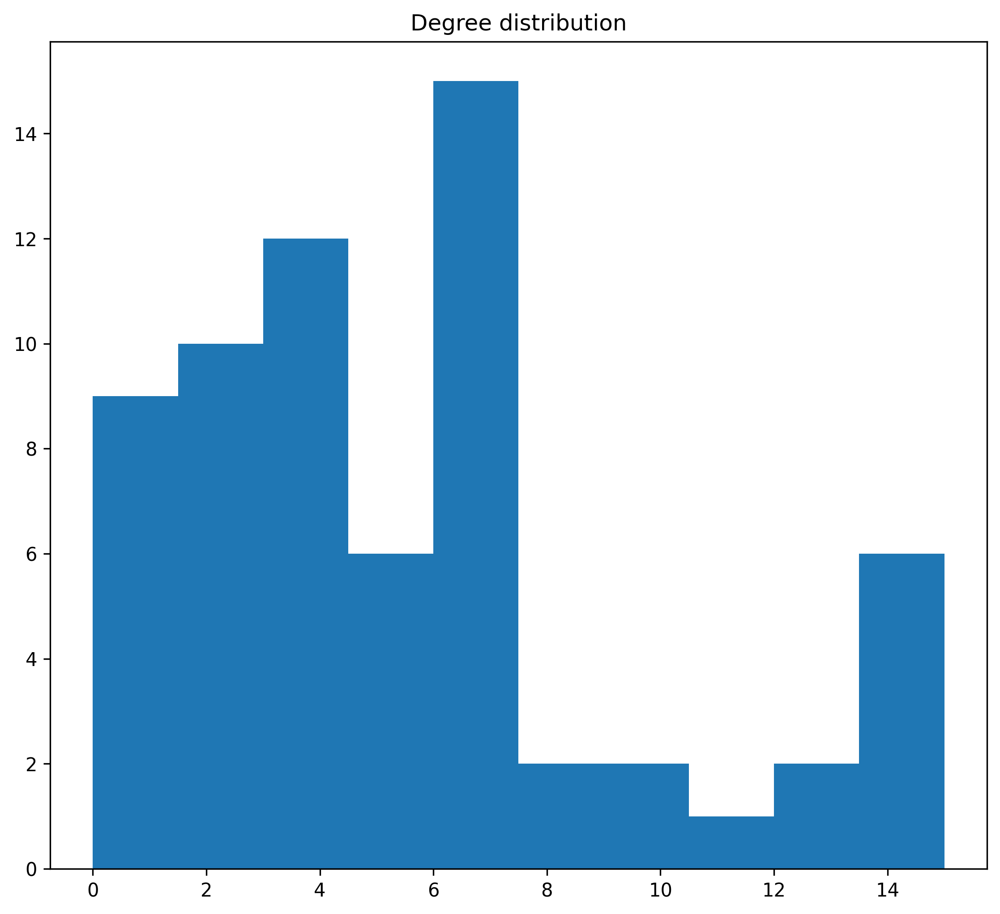

In [29]:
plt.hist(list(dict(nx.degree(ig)).values()))
plt.title("Degree distribution")
plt.show()

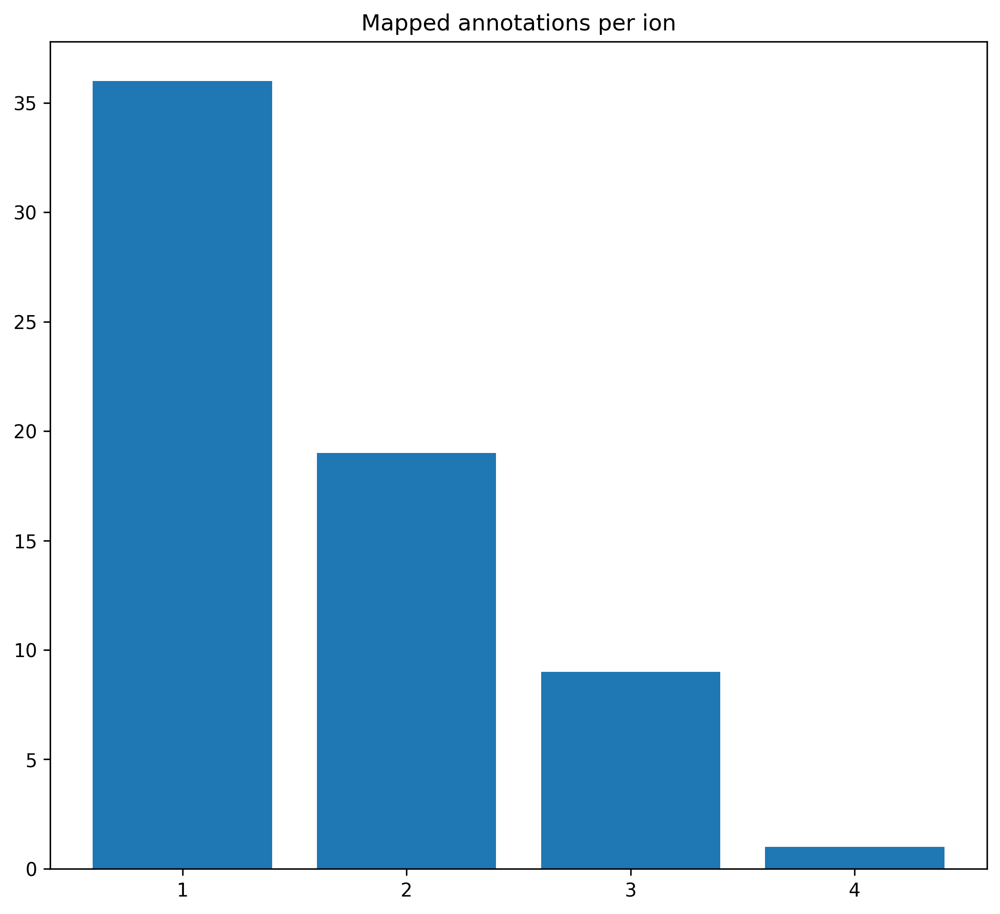

In [30]:
mapped_ambigous = [len(v['sum_species']) for k, v in dict(ig.nodes(data=True)).items()]
labels, counts = np.unique(mapped_ambigous, return_counts=True)
plt.bar(labels, counts, align='center')
plt.gca().set_xticks(labels)
plt.title("Mapped annotations per ion")
plt.show()

### Correlation vs. linex network

In [46]:
# Cosine --------
lipid_similarity = pd.DataFrame(pairwise_kernels(adata.X.transpose(), metric='cosine'))
# Correlation ---
# lipid_similarity = pd.DataFrame(np.corrcoef(adata.X.transpose()))
lipid_similarity.rename(columns={i: l for i, l in zip(range(adata.shape[1]), adata.var.index)}, inplace=True)
lipid_similarity.set_index(adata.var.index, inplace=True)

0.6825221
0.6495498


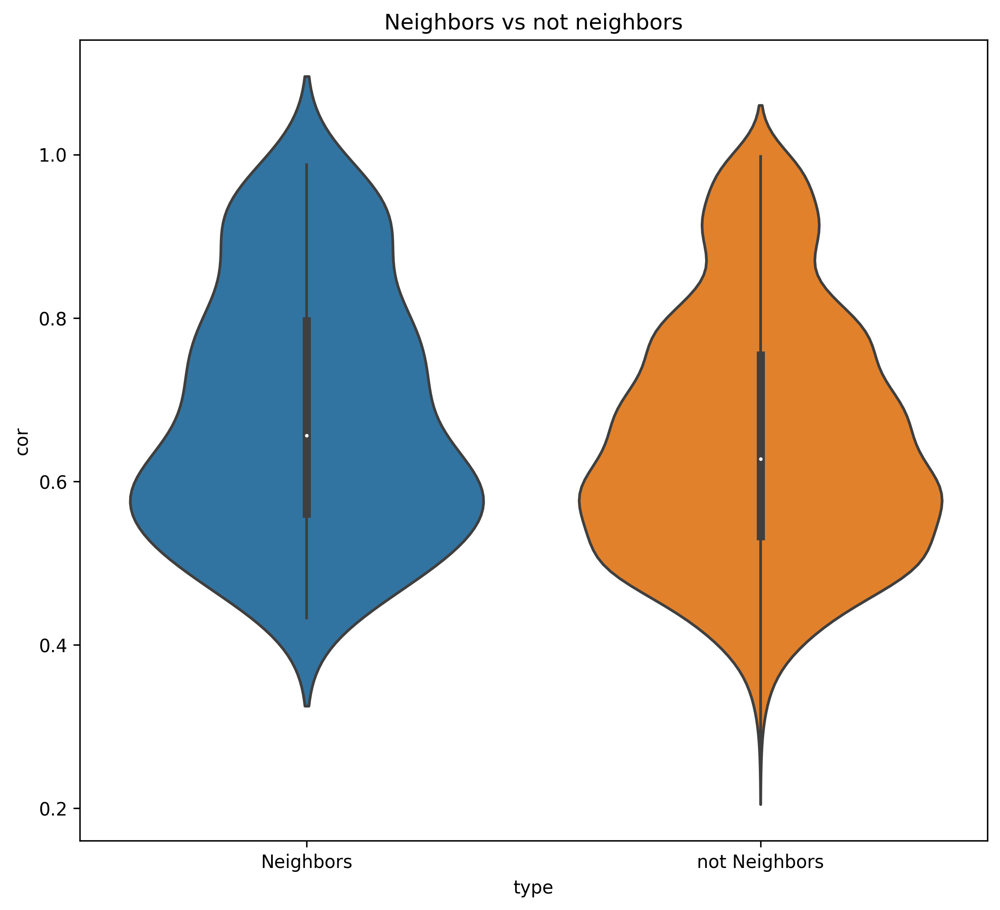

In [47]:
# Loop over all pairs of lipids

ls = lipid_similarity
led = list(ig.edges)

edge_cor = []
nedge_cor = []

for l1 in range(len(ls.columns)):
    for l2 in range(l1+1, len(ls.columns)):
        if (ls.columns[l1], ls.columns[l2]) in led or (ls.columns[l2], ls.columns[l1]) in led:
            edge_cor.append(ls.iloc[l1, l2])
        else:
            nedge_cor.append(ls.iloc[l1, l2])

tmp_dat = pd.concat([
    pd.DataFrame({'cor': edge_cor, 'type': 'Neighbors'}),
    pd.DataFrame({'cor': nedge_cor, 'type': 'not Neighbors'}),
          ])

print(np.mean(edge_cor))
print(np.mean(nedge_cor))

sns.violinplot(tmp_dat, x='type', y='cor')
plt.title("Neighbors vs not neighbors")
plt.show()

In [34]:
scipy.stats.ttest_ind(edge_cor, nedge_cor)

Ttest_indResult(statistic=2.7905676161778707, pvalue=0.005297562209928129)

In [35]:
scipy.stats.mannwhitneyu(edge_cor, nedge_cor)

MannwhitneyuResult(statistic=251515.0, pvalue=0.009565955521320202)

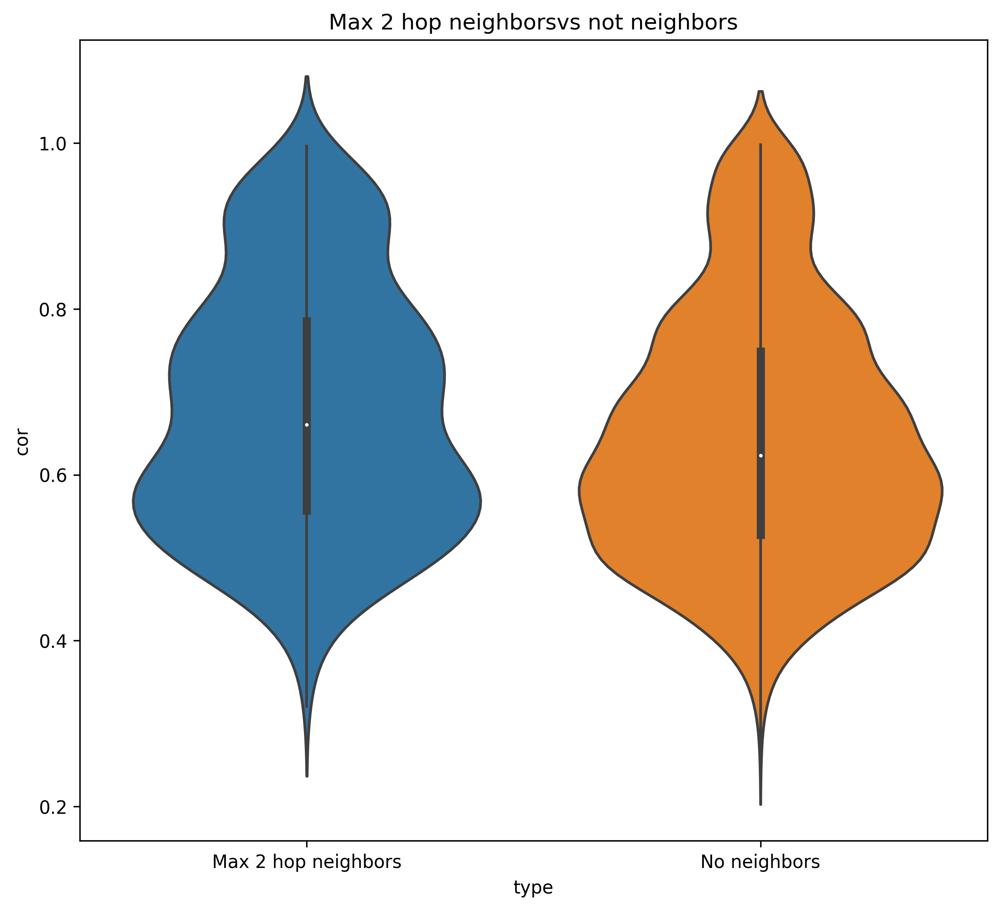

MannwhitneyuResult(statistic=716691.0, pvalue=7.793188467194257e-06)

In [49]:
def catch_sp(g, source, target):
    try:
        return nx.shortest_path_length(g, source, target)
    except:
        return np.inf
    

ls = lipid_similarity
led = list(ig.edges)

edge_cor = []
nedge_cor = []

max_hops = 2

for l1 in range(len(ls.columns)):
    for l2 in range(l1+1, len(ls.columns)):
        if catch_sp(ig, ls.columns[l1], ls.columns[l2]) <= max_hops:
            edge_cor.append(ls.iloc[l1, l2])
        else:
            nedge_cor.append(ls.iloc[l1, l2])

tmp_dat = pd.concat([
    pd.DataFrame({'cor': edge_cor, 'type': 'Max '+str(max_hops)+' hop neighbors'}),
    pd.DataFrame({'cor': nedge_cor, 'type': 'No neighbors'}),
          ])

sns.violinplot(tmp_dat, x='type', y='cor')
plt.title('Max '+str(max_hops)+' hop neighborsvs not neighbors')
plt.show()

scipy.stats.mannwhitneyu(edge_cor, nedge_cor)

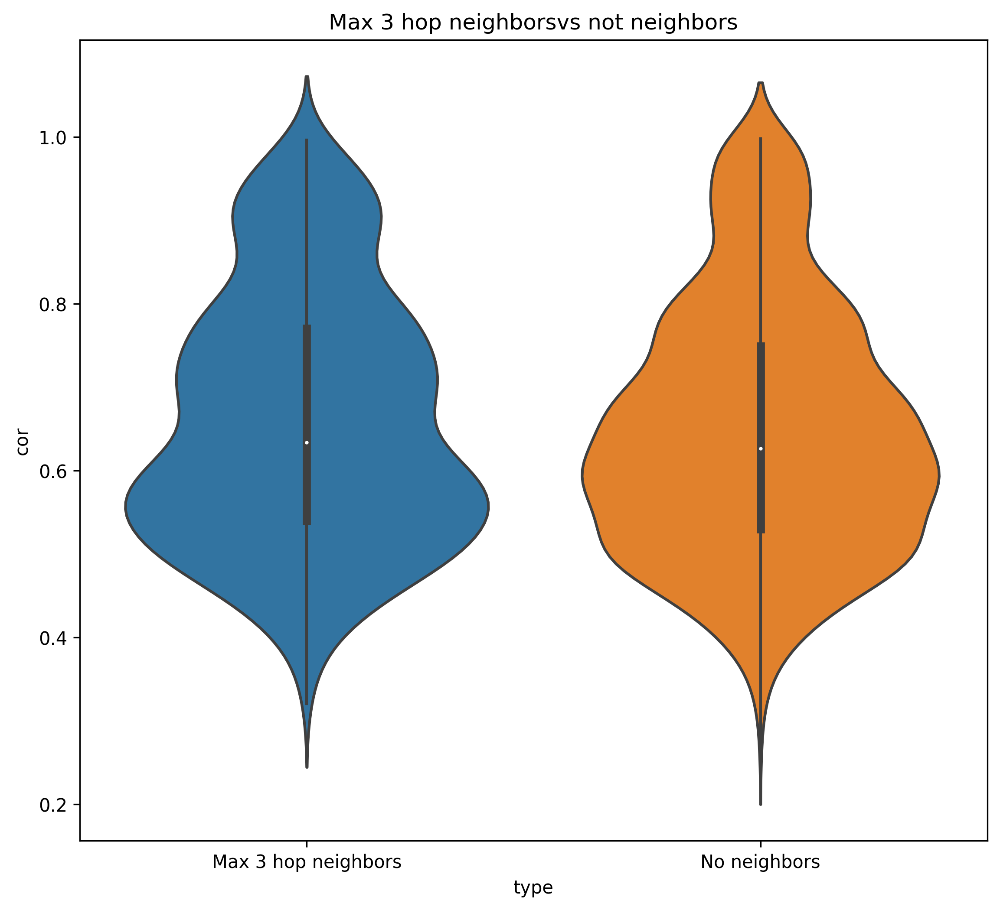

MannwhitneyuResult(statistic=927207.0, pvalue=0.0478079646485147)

In [50]:
ls = lipid_similarity
led = list(ig.edges)

edge_cor = []
nedge_cor = []

max_hops = 3

for l1 in range(len(ls.columns)):
    for l2 in range(l1+1, len(ls.columns)):
        if catch_sp(ig, ls.columns[l1], ls.columns[l2]) <= max_hops:
            edge_cor.append(ls.iloc[l1, l2])
        else:
            nedge_cor.append(ls.iloc[l1, l2])

tmp_dat = pd.concat([
    pd.DataFrame({'cor': edge_cor, 'type': 'Max '+str(max_hops)+' hop neighbors'}),
    pd.DataFrame({'cor': nedge_cor, 'type': 'No neighbors'}),
          ])

sns.violinplot(tmp_dat, x='type', y='cor')
plt.title('Max '+str(max_hops)+' hop neighborsvs not neighbors')
plt.show()

scipy.stats.mannwhitneyu(edge_cor, nedge_cor)

## Annotation/ranking statistics

/tmp/ipykernel_5793/1184055063.py:1: RuntimeWarning: invalid value encountered in long_scalars
  fraction_top = [v['sum_species'][0]/sum(v['sum_species']) for k, v in dict(ig.nodes(data=True)).items()]


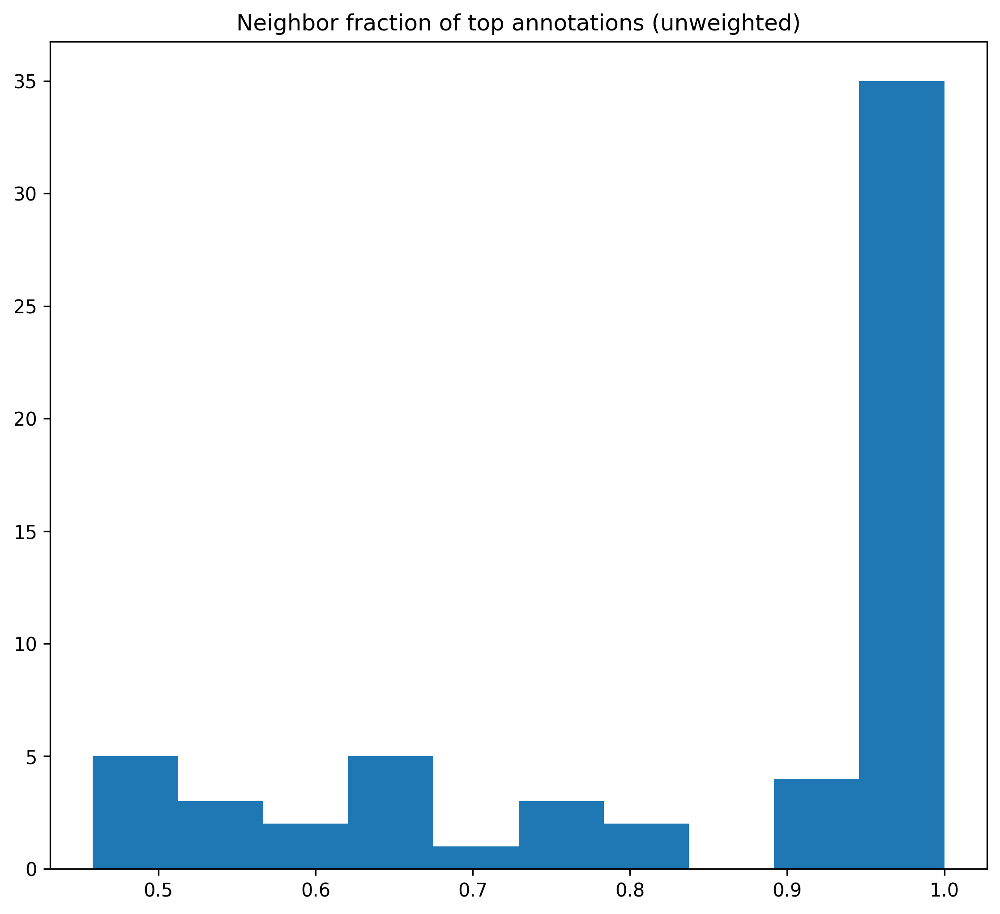

In [38]:
fraction_top = [v['sum_species'][0]/sum(v['sum_species']) for k, v in dict(ig.nodes(data=True)).items()]
plt.hist(fraction_top)
plt.title("Neighbor fraction of top annotations (unweighted)")
plt.show()

/tmp/ipykernel_5793/1426306028.py:1: RuntimeWarning: invalid value encountered in long_scalars
  fraction_top = [v['sum_species'][0]/sum(v['sum_species']) for k, v in dict(ig_sim.nodes(data=True)).items()]


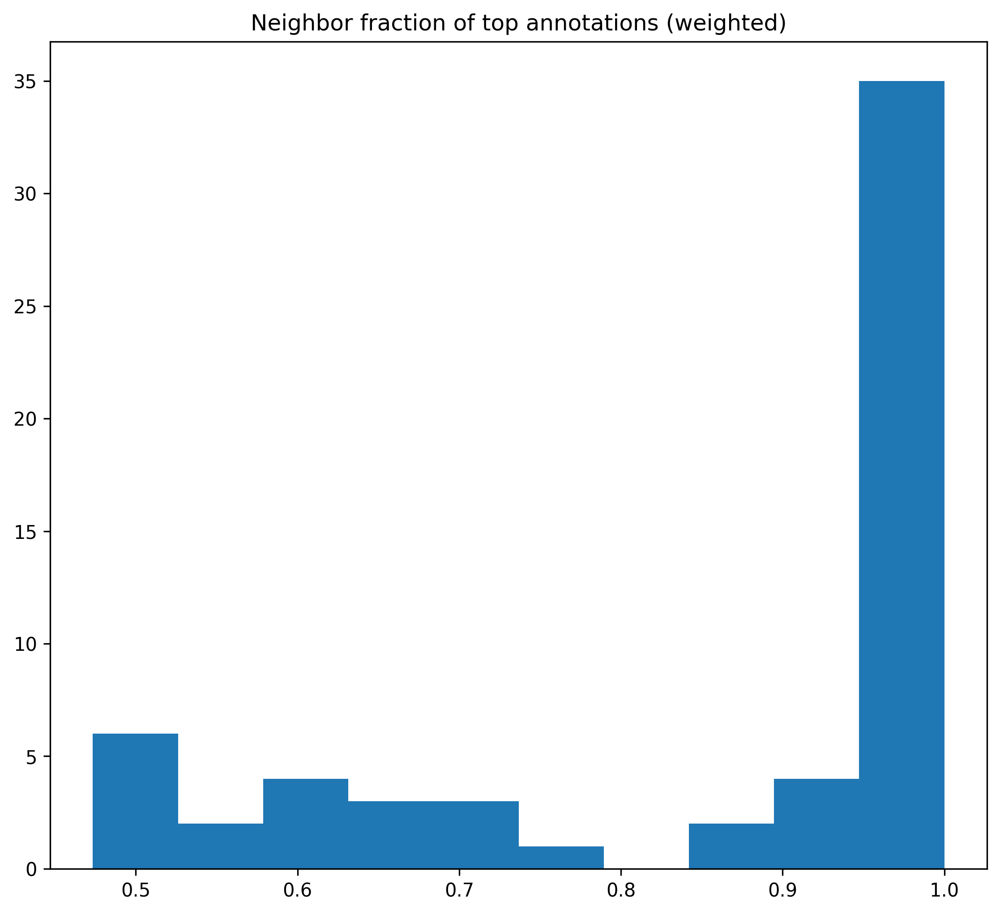

In [39]:
fraction_top = [v['sum_species'][0]/sum(v['sum_species']) for k, v in dict(ig_sim.nodes(data=True)).items()]
plt.hist(fraction_top)
plt.title("Neighbor fraction of top annotations (weighted)")
plt.show()

In [40]:
#fraction_top = [v['sum_species'][0]/sum(v['sum_species'])


### Unweighted

/tmp/ipykernel_191/4083573169.py:6: RuntimeWarning: invalid value encountered in true_divide
  'proportion':v['sum_species'].values/sum(v['sum_species']),


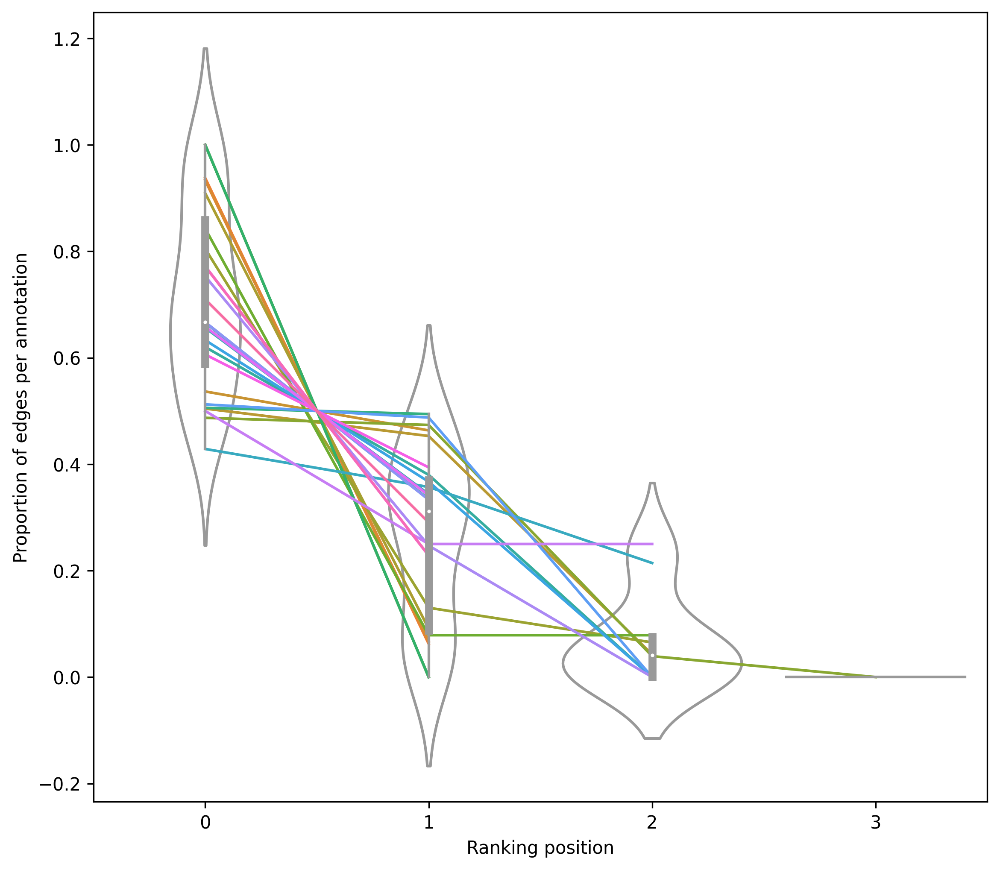

In [22]:
df_l = []
counter=0
for k, v in dict(ig.nodes(data=True)).items():
    if len(v['sum_species'])>1:
        df_l.append(pd.DataFrame({'position': list(range(len(v['sum_species']))), 
                                  'proportion':v['sum_species'].values/sum(v['sum_species']),
                                  'node': str(counter)
                                 }))
    counter+=1

fig, ax = plt.subplots()
sns.lineplot(pd.concat(df_l).reset_index(), x='position', y='proportion', hue='node', ax=ax)
sns.violinplot(pd.concat(df_l).reset_index(), x='position', y='proportion', ax=ax, boxprops=dict(alpha=.3), color='white')
plt.legend([],[], frameon=False)
plt.title("")
plt.xlabel('Ranking position')
plt.ylabel('Proportion of edges per annotation')
plt.show()

In [52]:


out_dict = get_ranking_dict(ig)


    
    
# Evaluate
# Only for cases where even and odd chain lipid in annotation


avg_even_pos = []
avg_odd_pos = []
for k, v in out_dict.items():
    if not all([v2['iseven'] for v2 in v.values()]) and not all([not v2['iseven'] for v2 in v.values()]):
        # Get everage even pos
        avg_even_pos.append(np.mean([v2['relpos'] for v2 in v.values() if v2['iseven']]))
        # get average odd pos
        avg_odd_pos.append(np.mean([v2['relpos'] for v2 in v.values() if not v2['iseven']]))
        
eo_df = pd.concat([pd.DataFrame({'pos': avg_even_pos, 'type': 'even'}), 
                   pd.DataFrame({'pos': avg_odd_pos, 'type': 'odd'})]).reset_index()
        
avg_ether_pos = []
avg_nonether_pos = []
for k, v in out_dict.items():
    if not all([v2['hasether']==0 for v2 in v.values()]) and not all([v2['hasether']>0 for v2 in v.values()]):
        # Get everage even pos
        avg_ether_pos.append(np.mean([v2['relpos'] for v2 in v.values() if v2['hasether']>0]))
        # get average odd pos
        avg_nonether_pos.append(np.mean([v2['relpos'] for v2 in v.values() if v2['hasether']==0]))
        
ether_df = pd.concat([pd.DataFrame({'pos': avg_ether_pos, 'type': 'ether'}), 
                   pd.DataFrame({'pos': avg_nonether_pos, 'type': 'ester'})]).reset_index()

In [53]:
eo_df.groupby(['type']).mean()

,index,pos
type,,
even,10.0,0.392857
odd,10.0,0.595238


Text(0, 0.5, 'Relative ranking')

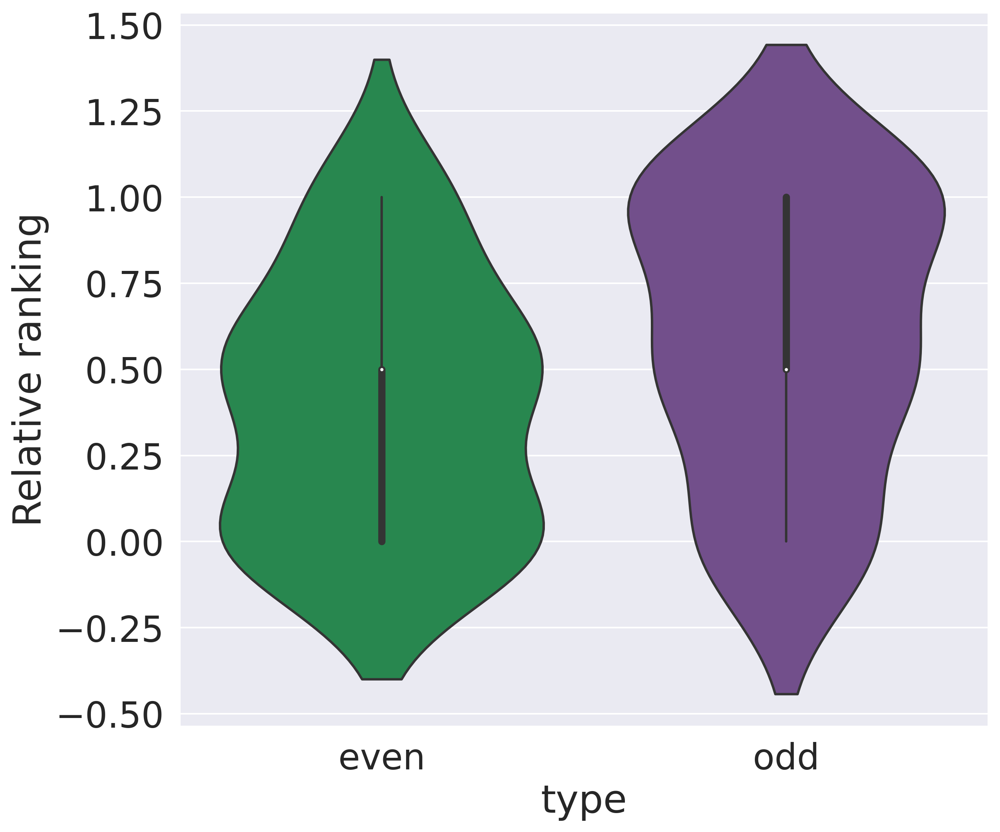

In [59]:
sns.set(font_scale=2)
sns.violinplot(eo_df, x='type', y='pos', palette={'even': '#18974C', 'odd': '#734595'}, scale='area')
plt.ylabel('Relative ranking')

Text(0, 0.5, 'Relative ranking')

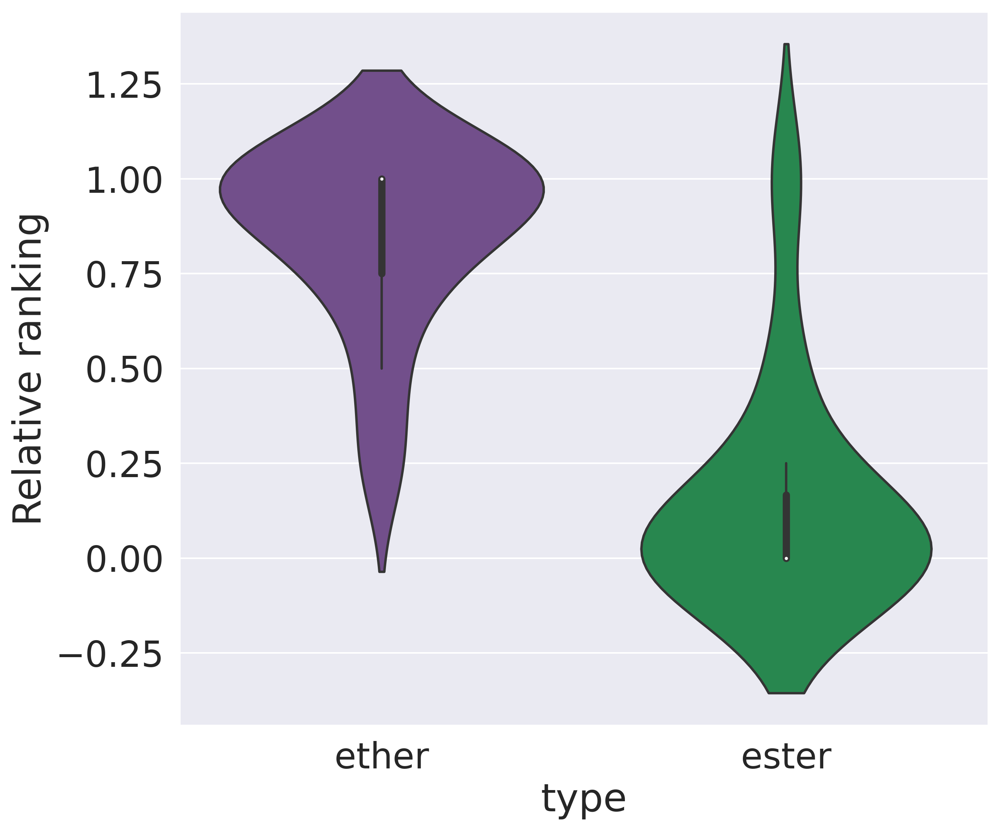

In [58]:
sns.set(font_scale=2)
sns.violinplot(ether_df, x='type', y='pos', palette={'ester': '#18974C', 'ether': '#734595'})
plt.ylabel('Relative ranking')

### Weighted

/tmp/ipykernel_114/258861783.py:6: RuntimeWarning: invalid value encountered in true_divide
  'proportion':v['sum_species'].values/sum(v['sum_species']),


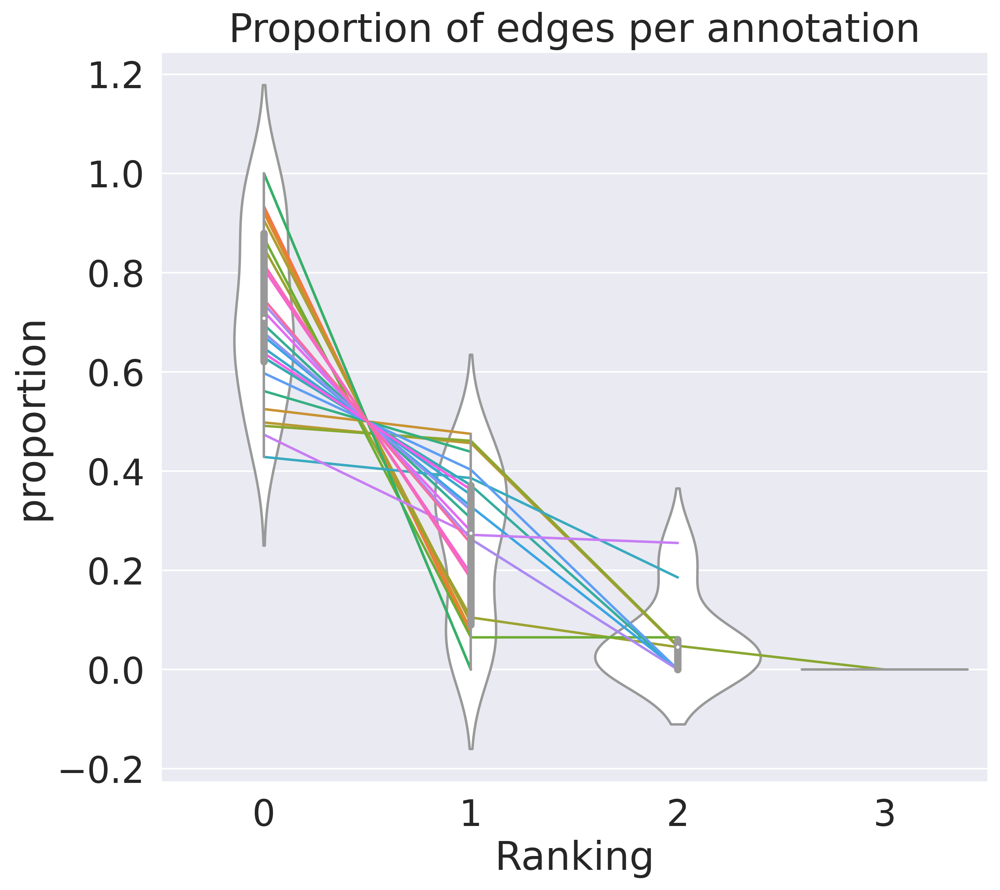

In [60]:
df_l = []
counter=0
for k, v in dict(ig_sim.nodes(data=True)).items():
    if len(v['sum_species'])>1:
        df_l.append(pd.DataFrame({'position': list(range(len(v['sum_species']))), 
                                  'proportion':v['sum_species'].values/sum(v['sum_species']),
                                  'node': str(counter)
                                 }))
    counter+=1

fig, ax = plt.subplots()
sns.lineplot(pd.concat(df_l).reset_index(), x='position', y='proportion', hue='node', ax=ax)
sns.violinplot(pd.concat(df_l).reset_index(), x='position', y='proportion', ax=ax, boxprops=dict(alpha=.3), color='white')
plt.legend([],[], frameon=False)
plt.title("Proportion of edges per annotation")
plt.xlabel('Ranking')
plt.show()

In [61]:
out_dict = get_ranking_dict(ig_sim)


    
    
# Evaluate
# Only for cases where even and odd chain lipid in annotation


avg_even_pos = []
avg_odd_pos = []
for k, v in out_dict.items():
    if not all([v2['iseven'] for v2 in v.values()]) and not all([not v2['iseven'] for v2 in v.values()]):
        # Get everage even pos
        avg_even_pos.append(np.mean([v2['relpos'] for v2 in v.values() if v2['iseven']]))
        # get average odd pos
        avg_odd_pos.append(np.mean([v2['relpos'] for v2 in v.values() if not v2['iseven']]))
        
eo_df = pd.concat([pd.DataFrame({'pos': avg_even_pos, 'type': 'even'}), 
                   pd.DataFrame({'pos': avg_odd_pos, 'type': 'odd'})]).reset_index()
        
avg_ether_pos = []
avg_nonether_pos = []
for k, v in out_dict.items():
    if not all([v2['hasether']==0 for v2 in v.values()]) and not all([v2['hasether']>0 for v2 in v.values()]):
        # Get everage even pos
        avg_ether_pos.append(np.mean([v2['relpos'] for v2 in v.values() if v2['hasether']>0]))
        # get average odd pos
        avg_nonether_pos.append(np.mean([v2['relpos'] for v2 in v.values() if v2['hasether']==0]))
        
ether_df = pd.concat([pd.DataFrame({'pos': avg_ether_pos, 'type': 'ether'}), 
                   pd.DataFrame({'pos': avg_nonether_pos, 'type': 'ester'})]).reset_index()

In [30]:
eo_df.groupby(['type']).mean()

,index,pos
type,,
even,10.0,0.373016
odd,10.0,0.626984


Text(0, 0.5, 'Relative ranking')

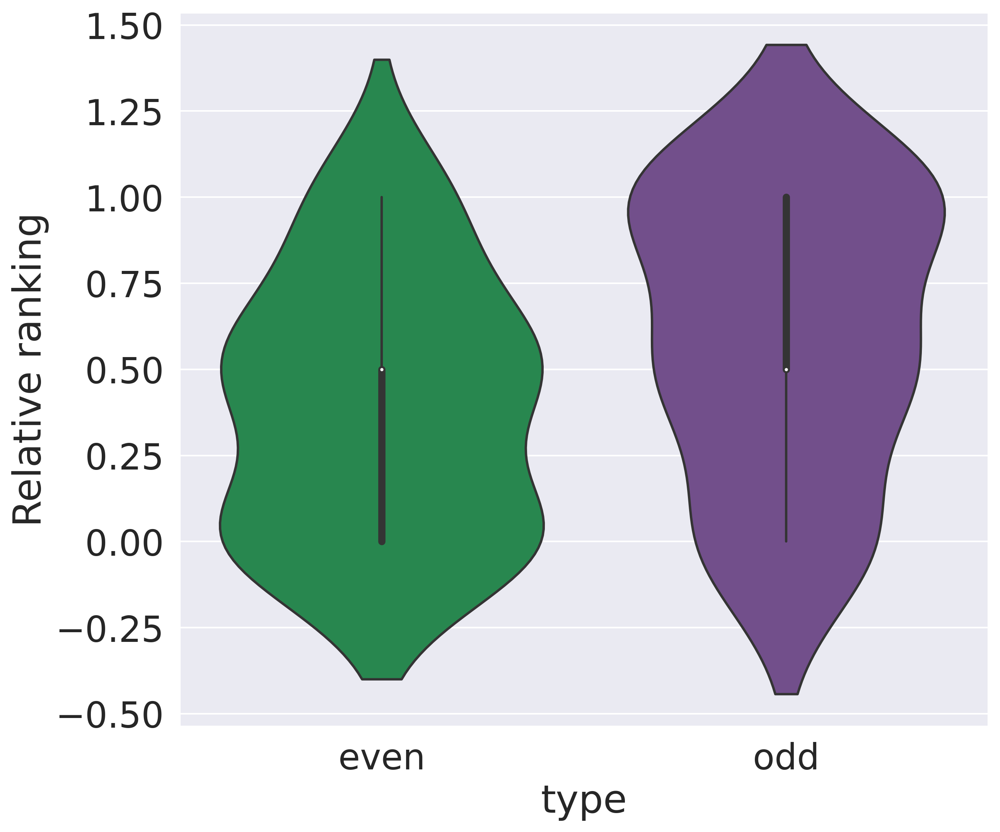

In [62]:
sns.set(font_scale=2)
sns.violinplot(eo_df, x='type', y='pos', palette={'even': '#18974C', 'odd': '#734595'}, scale='area')
plt.ylabel('Relative ranking')

Text(0, 0.5, 'Relative ranking')

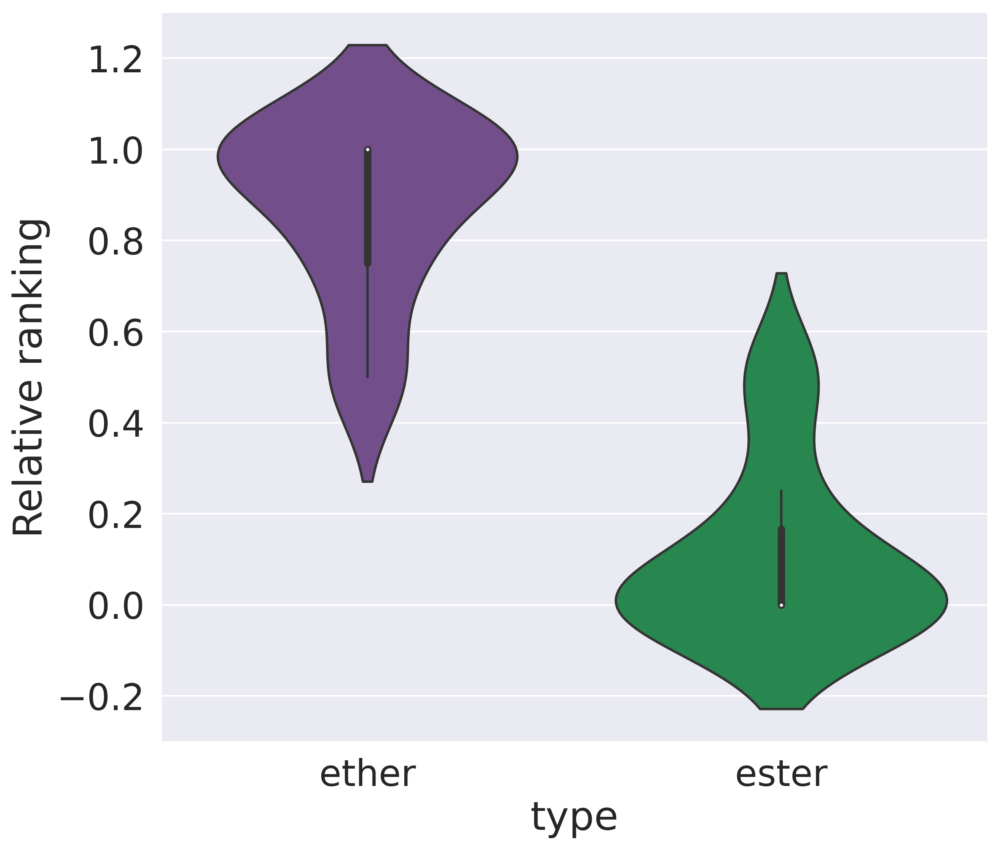

In [63]:
sns.set(font_scale=2)
sns.violinplot(ether_df, x='type', y='pos', palette={'ester': '#18974C', 'ether': '#734595'}, scale='area')
plt.ylabel('Relative ranking')

In [51]:
ig.nodes(data=True)[('C21H44NO7P', '-H')]['sum_species']

LPE(16:0)     11.733333
LPC(13:0)     10.375000
PE(O-16:0)     1.000000
dtype: float64

In [52]:
ig_sim.nodes(data=True)[('C21H44NO7P', '-H')]['sum_species']

LPE(16:0)     8.368107
LPC(13:0)     7.272829
PE(O-16:0)    0.785291
dtype: float64

In [53]:
annotations.loc[('C39H76NO8P','-H')]['moleculeNames']

['PE(22:1(13Z)/12:0)',
 'PE(18:1(11Z)/16:0)',
 'PC(16:1(6Z)/15:0)',
 'PE(20:1(11Z)/14:0)',
 'PE(18:1(11E)/16:0)',
 'PE(16:0/18:1(11Z))',
 'PE(10:0/24:1(15Z))',
 'PC(17:0/14:1(9Z))',
 'PC(18:1(11Z)/13:0)',
 'PC(18:1(11E)/13:0)',
 'PE(16:0/18:1(6Z))',
 'PC(18:1(9Z)/13:0)',
 'PC(13:0/18:1(11Z))',
 'PE(12:0/22:1(13Z))',
 'PC(15:0/16:1(6Z))',
 'PE(8:0/26:1(17Z))',
 'PC(15:0/16:1(9Z))',
 'PC(16:1(9Z)/15:0)',
 'PC(18:1(6Z)/13:0)',
 'PE(14:1(9Z)/20:0)',
 'PE(18:1(6Z)/16:0)',
 'PC(13:0/18:1(11E))',
 'PC(17:0/14:1(9Z))',
 'PC(14:1(9Z)/17:0)',
 'PE(26:1(17Z)/8:0)',
 'PE(20:0/14:1(9Z))',
 'PE(24:1(15Z)/10:0)',
 'PC(18:1(6Z)/13:0)',
 'PC(13:0/18:1(6Z))',
 'PE(16:1(9Z)/18:0)',
 'PE(18:0/16:1(6Z))',
 'PC(15:0/16:1(9Z))',
 'PC(13:0/18:1(9Z))',
 'PC(18:1(11E)/13:0)',
 'PE(18:1(9Z)/16:0)',
 'PE(18:0/16:1(9Z))',
 'PC(13:0/18:1(9Z))',
 'PC(14:1(9Z)/17:0)',
 'PE(16:0/18:1(11E))',
 'PC(13:0/18:1(11Z))',
 'PC(13:0/18:1(6Z))',
 'PE(16:0/18:1(9Z))',
 'PE(16:1(6Z)/18:0)',
 'PC(16:1(9Z)/15:0)',
 'PC(15:0/16:1(6Z

# Comparison to LC-MS data

## Formating data

In [23]:
bulk_pos = pd.read_csv('data/hela_nih3t3/LCMS_pos.csv')
bulk_neg = pd.read_csv('data/hela_nih3t3/LCMS_neg.csv')

bulk_pos = bulk_pos[['Metabolite name', 'Blank_prep_no_IS_Pos_0uL'] + 
                    [x for x in bulk_pos.columns if x.startswith('Luca140818')]]
bulk_neg = bulk_neg[['Metabolite name', 'Blank_prep_no_IS_Neg_0uL'] + 
                    [x for x in bulk_neg.columns if x.startswith('Luca140818')]]

bulk_pos[['sum_species', 'molecular_species']] = bulk_pos['Metabolite name'].str.split('|', expand=True)
bulk_neg[['sum_species', 'molecular_species']] = bulk_neg['Metabolite name'].str.split('|', expand=True)

In [24]:
bulk_pos

,Metabolite name,Blank_prep_no_IS_Pos_0uL,Luca140818_lipid_Pos_co_culture_1,Luca140818_lipid_Pos_co_culture_2,Luca140818_lipid_Pos_co_culture_3,Luca140818_lipid_Pos_co_culture_4,Luca140818_lipid_Pos_co_culture_5,Luca140818_lipid_Pos_hela_1,Luca140818_lipid_Pos_hela_2,Luca140818_lipid_Pos_hela_3,Luca140818_lipid_Pos_hela_4,Luca140818_lipid_Pos_hela_5,Luca140818_lipid_Pos_nih_1,Luca140818_lipid_Pos_nih_2,Luca140818_lipid_Pos_nih_3,Luca140818_lipid_Pos_nih_4,Luca140818_lipid_Pos_nih_5,sum_species,molecular_species
0,BMP 32:0|BMP 16:0_16:0,12522,56566288,54663332,70673968,79277032,59305744,52999420,52995236,81878976,88907864,93809272,26564464,35593328,30502638,35690064,27339520,BMP 32:0,BMP 16:0_16:0
1,BMP 44:12|BMP 22:6_22:6,0,1398435,2248820,1600916,2312564,1896818,483875,331385,539193,1127513,1055772,2709029,3103330,3083543,3022326,2490894,BMP 44:12,BMP 22:6_22:6
2,CAR 14:0,875417,1776932,1948917,3194893,3225425,3299993,2012790,1805428,1731176,1593427,1651876,2243897,3491314,2860315,2790526,2704952,CAR 14:0,None
3,CAR 16:0,25196,5422893,5307008,11717121,10417089,12646901,6901450,5360884,5319170,5855978,8192462,6430846,9490734,8514170,7361745,7292021,CAR 16:0,None
4,CAR 16:1,16521,1393299,1446500,2890106,2832716,2919654,4225156,2578702,2599904,2710881,3357492,1331726,2030065,1905944,1755872,1905210,CAR 16:1,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260,TG O-50:0|TG O-18:0_16:0_16:0,0,4974896,5564478,3946918,4720964,5147341,2693370,3206604,3087815,3135374,3097652,1305858,2497863,2159693,1724635,1666592,TG O-50:0,TG O-18:0_16:0_16:0
261,TG O-52:2|TG O-16:0_18:1_18:1,15538,14801532,13669833,13163765,15633427,16282800,8638258,12323864,11298107,316084,10650292,9132820,11664965,10063326,9526013,8240871,TG O-52:2,TG O-16:0_18:1_18:1
262,TG O-54:6|TG O-22:6_16:0_16:0,0,1613101,1253908,1100184,1247966,1571464,651736,799094,829304,528130,597965,1279246,1198574,1294862,1181764,1097830,TG O-54:6,TG O-22:6_16:0_16:0
263,TG O-56:6|TG O-18:1_18:1_20:4,14417,3512064,2602902,3205809,3525526,3743103,1158895,1758535,1449287,1867414,1830589,1279834,4717874,3622970,3458673,3159854,TG O-56:6,TG O-18:1_18:1_20:4


In [25]:
def uln(lip):
    tmp = lip.split(' ')
    if len(tmp)==1:
        return lip
    else:
        return f'{tmp[0]}({tmp[1]})'

# Update lipid nomenclature
bulk_pos['sum_species'] = bulk_pos['sum_species'].apply(uln)
bulk_neg['sum_species'] = bulk_neg['sum_species'].apply(uln)

In [26]:
bulk_neg['sum_species']

0       Cer(32:1;O2)
1       Cer(32:1;O2)
2       Cer(33:1;O2)
3       Cer(34:0;O2)
4       Cer(34:0;O2)
           ...      
308    SMGDG(O-36:2)
309    SMGDG(O-38:4)
310    SMGDG(O-38:5)
311    SMGDG(O-38:6)
312     ST(27:1;O;S)
Name: sum_species, Length: 313, dtype: object

In [27]:
bulk_neg

,Metabolite name,Blank_prep_no_IS_Neg_0uL,Luca140818_lipid_Neg_co_culture_1,Luca140818_lipid_Neg_co_culture_3,Luca140818_lipid_Neg_co_culture_4,Luca140818_lipid_Neg_co_culture_5,Luca140818_lipid_Neg_hela_1,Luca140818_lipid_Neg_hela_2,Luca140818_lipid_Neg_hela_3,Luca140818_lipid_Neg_hela_4,Luca140818_lipid_Neg_hela_5,Luca140818_lipid_Neg_nih_1,Luca140818_lipid_Neg_nih_2,Luca140818_lipid_Neg_nih_3,Luca140818_lipid_Neg_nih_4,Luca140818_lipid_Neg_nih_5,sum_species,molecular_species
0,Cer 32:1;O2|Cer 18:1;O2/14:0,23359,1369948,785848,1667991,397142,1160790,1682075,1273830,1474778,4610446,229008,240445,184216,339611,291712,Cer(32:1;O2),Cer 18:1;O2/14:0
1,Cer 32:1;O2|Cer 18:1;O2/14:0,22217,6059224,5260172,8554441,5747872,7293191,8991001,9081766,6438727,19597202,3448155,2915421,3788691,3435155,2531328,Cer(32:1;O2),Cer 18:1;O2/14:0
2,Cer 33:1;O2|Cer 17:1;O2/16:0,16634,0,0,416865,0,0,563678,300030,583194,3391477,0,0,0,0,0,Cer(33:1;O2),Cer 17:1;O2/16:0
3,Cer 34:0;O2|Cer 18:0;O2/16:0,33410,254807,314914,311556,217258,525145,874591,774333,985759,4096660,166856,0,0,0,0,Cer(34:0;O2),Cer 18:0;O2/16:0
4,Cer 34:0;O2|Cer 18:0;O2/16:0,47570,4062598,4142411,5548386,4428344,7038755,7095976,8036020,8446990,24988584,248437,594286,203816,448803,174746,Cer(34:0;O2),Cer 18:0;O2/16:0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
308,SMGDG O-36:2|SMGDG O-18:1_18:1,0,561762,2011041,1309775,2108788,130304,186813,131871,220263,2597601,1116472,958760,595432,920792,114329,SMGDG(O-36:2),SMGDG O-18:1_18:1
309,SMGDG O-38:4|SMGDG O-18:0_20:4,136948,884083,3228402,2253575,2249529,23303,36375,0,168906,796181,4972622,6106281,3890062,4640996,2283320,SMGDG(O-38:4),SMGDG O-18:0_20:4
310,SMGDG O-38:5|SMGDG O-18:1_20:4,12949,3449272,10815272,6313418,9493483,279788,527992,496851,1241374,3046122,15766254,14747486,13752422,12721595,6930742,SMGDG(O-38:5),SMGDG O-18:1_20:4
311,SMGDG O-38:6|SMGDG O-18:1_20:5,0,0,896028,198947,582373,0,0,0,0,215590,1323822,887158,892404,1124988,209338,SMGDG(O-38:6),SMGDG O-18:1_20:5


## Unweighted

### Ranking vs. identified in LC-MS

First very naive approach by using all identified sum species (ignoring mode & class bias)

In [28]:
len(set(bulk_pos['sum_species']))

241

In [29]:
len(set(bulk_neg['sum_species']))

292

In [30]:
identified_sum_species = set(list(bulk_neg['sum_species']) + list(bulk_pos['sum_species']))

In [31]:
out_dict = {}

# K - ion, V - data
for k, v in dict(ig.nodes(data=True)).items():
    sum_species = v['sum_species']
    # Get exemplary lipids for each sum species
    tmp_dict = {}
    for pos, ss, score in zip(range(len(sum_species)), sum_species.index, sum_species.values):
        # find a matching lipid
        for ll in v['parsed_lipids']:
            if ll.sum_species_str() == ss:
                break
        # Include only actually ranked lipids
        if not (sum_species==0).all():
            tmp_dict[ss] = {
                'relpos': scaling_position(pos, len(sum_species)), # FIX SCALING OF POSITIONS
                'abspos': pos,
                'score': score,
                'lipid': ll,
                'iseven': iseven(ll.sum_length()),
                'hasether': ll.get_ether()
                           }
    out_dict[k] = tmp_dict

# Evaluate
# Only for cases where even and odd chain lipid in annotation

conf_pos = []
nconf_pos = []

# Loop over all ions
for k, v in out_dict.items():
    
    # Loop over all ranked sum_species per ion
    for ss in v.keys():
        if ss in identified_sum_species:
            conf_pos.append(v[ss]['relpos'])
        else:
            nconf_pos.append(v[ss]['relpos'])
        
conf_df = pd.concat([pd.DataFrame({'pos': conf_pos, 'type': 'Confirmed lipids'}), 
                     pd.DataFrame({'pos': nconf_pos, 'type': 'Not confirmed lipids'})]).reset_index()

In [32]:
scipy.stats.mannwhitneyu(conf_pos, nconf_pos)

MannwhitneyuResult(statistic=577.5, pvalue=0.0024649968493248115)

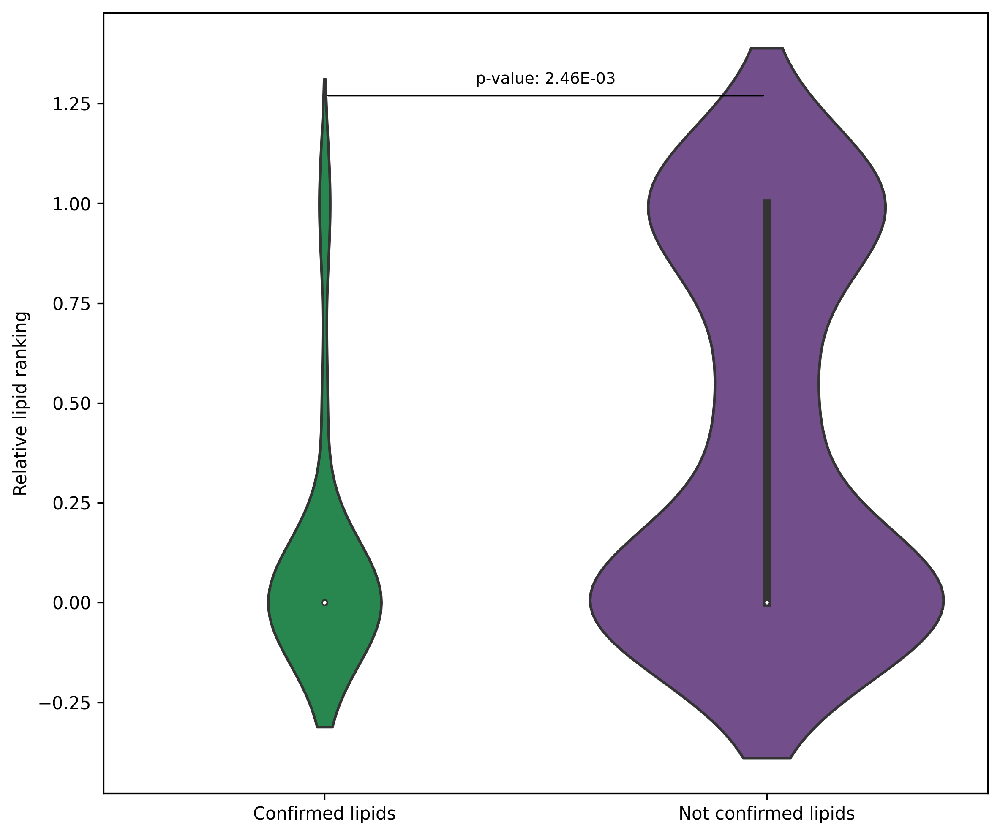

In [33]:
sns.violinplot(conf_df, x='type', y='pos', scale='count', palette={'Confirmed lipids': '#18974C', 
                                                                   'Not confirmed lipids': '#734595'})
plt.annotate('', xy=(0, 1.27), xytext=(1,1.27), arrowprops=dict(arrowstyle='-', color='black'))

testres = scipy.stats.mannwhitneyu(conf_pos, nconf_pos)
plt.annotate('p-value: {:.2E}'.format(testres.pvalue), xy=(0.5, 1.3), ha='center', fontsize=9)
plt.ylabel('Relative lipid ranking')
plt.xlabel('')
plt.show()

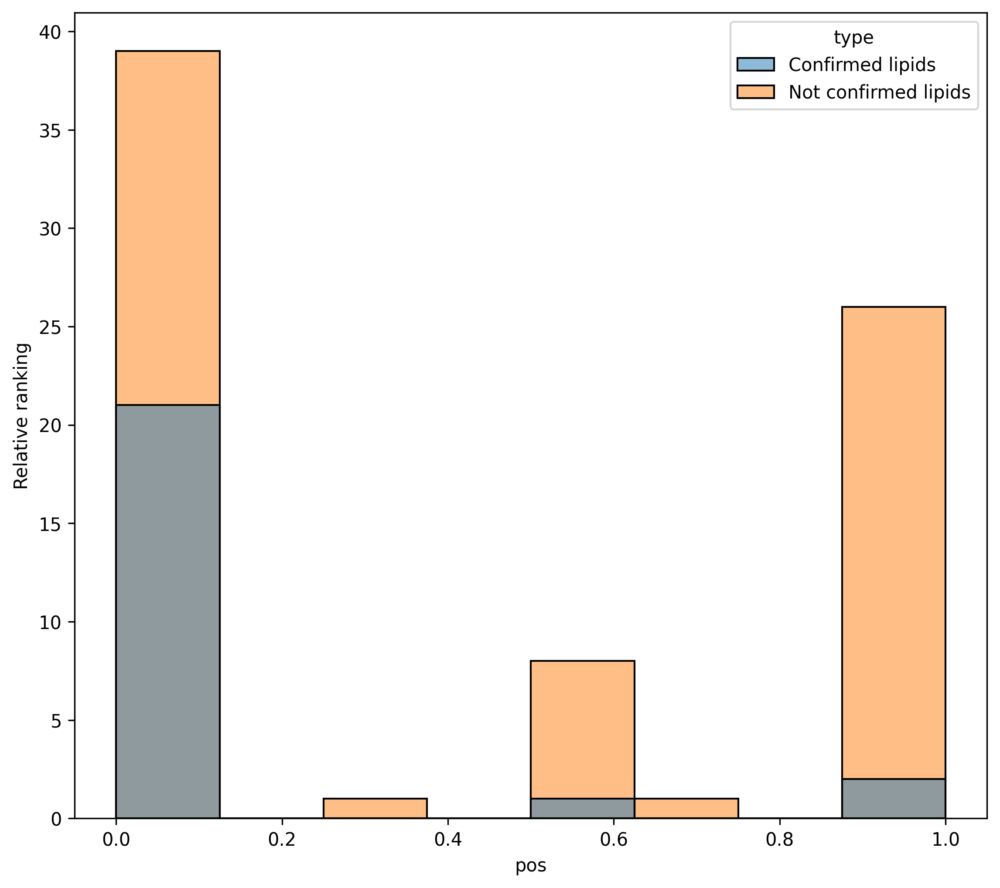

In [34]:
sns.histplot(conf_df, x='pos', hue='type', multiple='layer')
plt.ylabel('Relative ranking')
plt.show()

#### Only Positive

In [35]:
# Evaluate
# Only for cases where even and odd chain lipid in annotation

conf_pos = []
nconf_pos = []

# Loop over all ions
for k, v in out_dict.items():
    
    # Loop over all ranked sum_species per ion
    for ss in v.keys():
        if ss in set(list(bulk_pos['sum_species'])):
            conf_pos.append(v[ss]['relpos'])
        else:
            nconf_pos.append(v[ss]['relpos'])
        
conf_df_positive = pd.concat([pd.DataFrame({'pos': conf_pos, 'type': 'confirmed'}), 
                     pd.DataFrame({'pos': nconf_pos, 'type': 'not_confirmed'})]).reset_index()

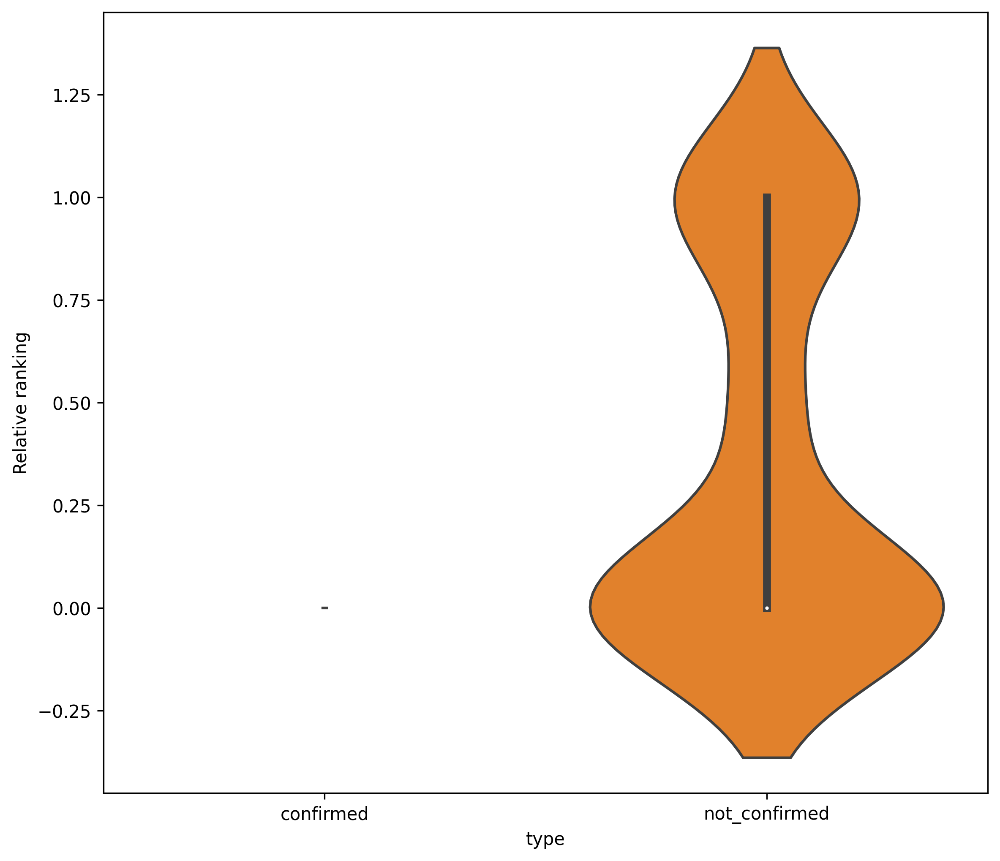

In [36]:
sns.violinplot(conf_df_positive, x='type', y='pos', scale='count')
plt.ylabel('Relative ranking')
plt.show()

#### Only negative

In [37]:
# Evaluate
# Only for cases where even and odd chain lipid in annotation

conf_pos = []
nconf_pos = []

# Loop over all ions
for k, v in out_dict.items():
    
    # Loop over all ranked sum_species per ion
    for ss in v.keys():
        if ss in set(list(bulk_neg['sum_species'])):
            conf_pos.append(v[ss]['relpos'])
        else:
            nconf_pos.append(v[ss]['relpos'])
        
conf_df_negative = pd.concat([pd.DataFrame({'pos': conf_pos, 'type': 'confirmed'}), 
                     pd.DataFrame({'pos': nconf_pos, 'type': 'not_confirmed'})]).reset_index()

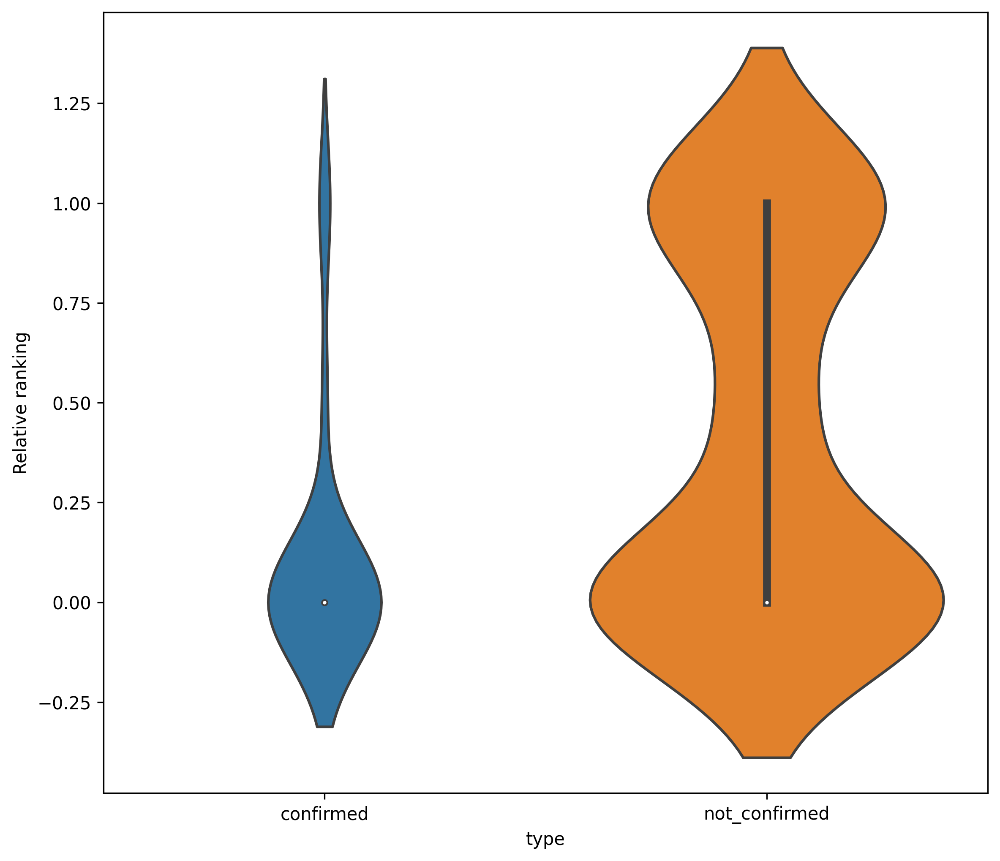

In [38]:
sns.violinplot(conf_df_negative, x='type', y='pos', scale='count')
plt.ylabel('Relative ranking')
plt.show()

<AxesSubplot: xlabel='pos', ylabel='Count'>

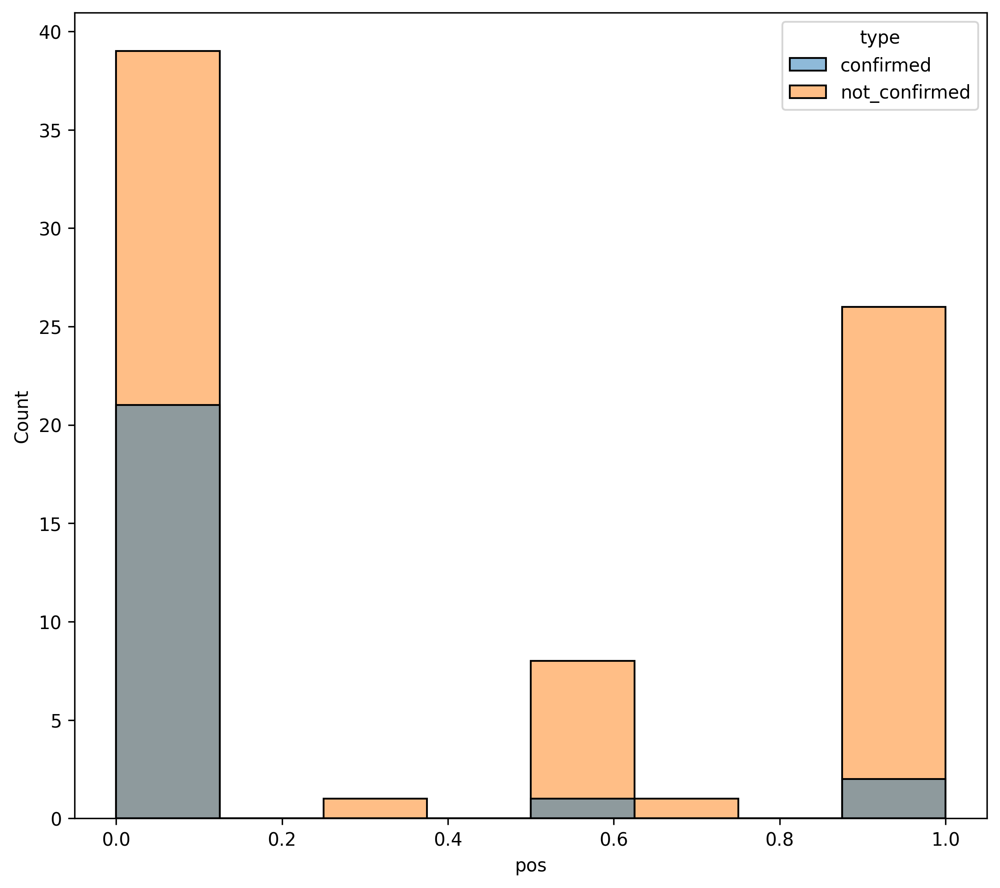

In [39]:
sns.histplot(conf_df_negative, x='pos', hue='type')

#### Only if lipid class was identified in bulk

In [40]:
identified_classes = set([x.split('(')[0] for x in identified_sum_species])

In [41]:
out_dict[('C19H37O7P', '-H')]['LPA(16:1)']['lipid'].get_lipid_class()

'LPA'

In [42]:
# Evaluate
# Only for cases where even and odd chain lipid in annotation

conf_pos = []
nconf_pos = []

# Loop over all ions
for k, v in out_dict.items():
    
    # Loop over all ranked sum_species per ion
    for ss in v.keys():
        if v[ss]['lipid'].get_lipid_class() in identified_classes:
            if ss in identified_sum_species:
                conf_pos.append(v[ss]['relpos'])
            else:
                nconf_pos.append(v[ss]['relpos'])
        
conf_df_class = pd.concat([pd.DataFrame({'pos': conf_pos, 'type': 'confirmed'}), 
                     pd.DataFrame({'pos': nconf_pos, 'type': 'not_confirmed'})]).reset_index()

In [43]:
scipy.stats.mannwhitneyu(conf_pos, nconf_pos)

MannwhitneyuResult(statistic=262.5, pvalue=0.0008565595479121581)

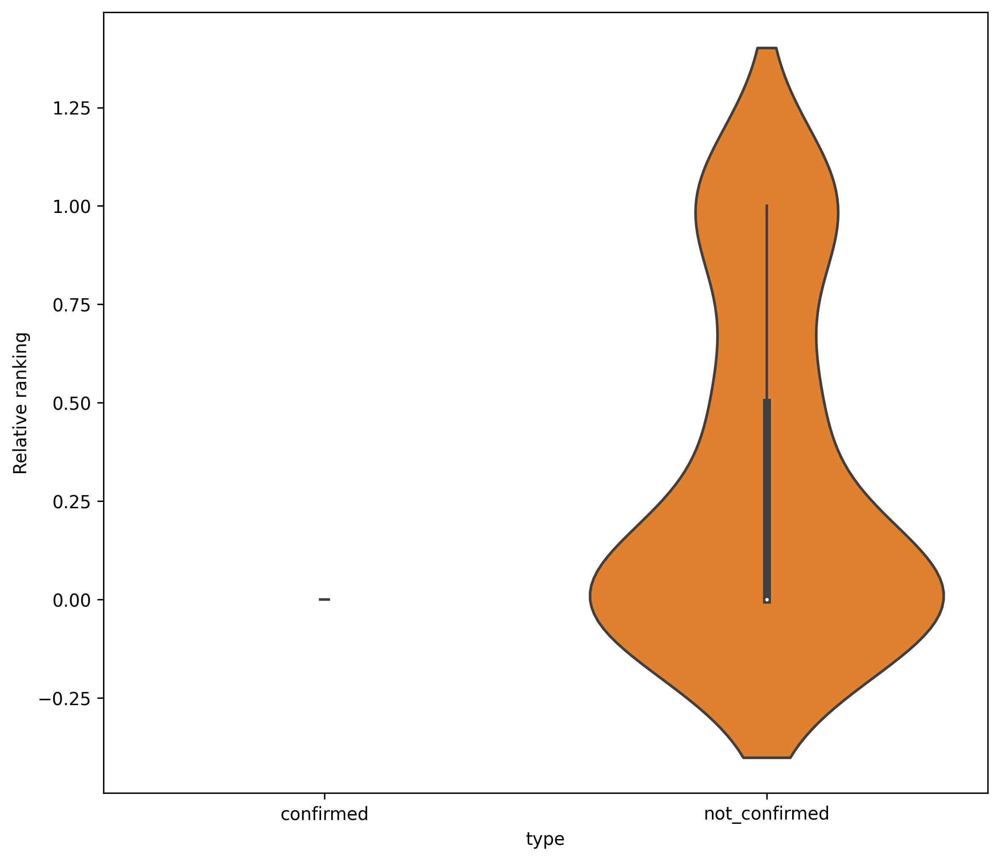

In [44]:
sns.violinplot(conf_df_class, x='type', y='pos', scale='count')
plt.ylabel('Relative ranking')
plt.show()

### Cut-off selection

In [45]:
def calculate_confusion_matrix(ranking_dict, cut_off_function, ground_truth, **kwargs):
    out = {'tp': 0, 'fp': 0, 'tn': 0, 'fn': 0}
    
    for ion, ranking in ranking_dict.items():
        tmp = cut_off_function(ranking, **kwargs)
        
        for ss, indication in tmp.items():
            if ss in ground_truth and indication==1:
                out['tp'] +=1
            elif ss not in ground_truth and indication==1:
                out['fp'] +=1
            elif ss not in ground_truth and indication==0:
                out['tn'] +=1
            elif ss in ground_truth and indication==0:
                out['fn'] +=1
    
    return out

def first_cutoff(ranking):
    return {ss: 1 if info['relpos']==0 else 0 for ss, info in ranking.items()}

def abs_cutoff(ranking, position=1):
    return {ss: 1 if info['abspos']<=position else 0 for ss, info in ranking.items()}

def scoring_cutoff(ranking, fraction=0.3):
    total_score = sum([info['score'] for info in ranking.values()])
    
    return {ss: 1 if info['score']/total_score>=fraction else 0 for ss, info in ranking.items()}

def randomly_picking(ranking, num=1):
    tmp = list(ranking.keys())
    if (len(tmp)>0):
        if len(tmp)>=num:
            choice = random.sample(tmp, k=num)
        else:
            choice = random.sample(tmp, k=len(tmp))
    else:
        choice = ''
    return {ss: 1 if ss in choice else 0 for ss, info in ranking.items()}
        
def sensitivity(x):
    return x['tp'] / (x['tp'] + x['fn'])

def specificity(x):
    return x['tn'] / (x['tn'] + x['fp'])

def accuracy(x):
    return (x['tp'] + x['tn'])/(x['fn']+x['tn']+x['fp']+x['tp'])

def f1score(x):
    return (x['tp']*2)/(x['tp']*2 + x['fp'] + x['fn'])

def all_scores(x, metric, verbose = True):
    return_dict = {
        'sensitivity': sensitivity(x),
        'specificity': specificity(x),
        'accuracy': accuracy(x),
        'f1score': f1score(x)
                  }
    if verbose:
        print(f'{metric}:')
        print(f'- sensitivity: {round(return_dict["sensitivity"], 3)}')
        print(f'- specificity: {round(return_dict["specificity"], 3)}')
        print(f'- accuracy: {round(return_dict["accuracy"], 3)}')
        print(f'- F1-score: {round(return_dict["f1score"], 3)}')
        
    return return_dict

def eval_scores(ig_evaluation_dict, absolute_position=1, scoring_fraction=0.7, random_num=1):
    eval_dict = {'bootstraps': [], 'sensitivity': [], 'specificity': [], 
                 'accuracy': [], 'f1score': [], 'cut-off metric': []}

    # Loop over bootstraps
    for bt, nets in ig_evaluation_dict.items():
        # Loop over repetitions
        for net in nets:
            ranking_dict = get_ranking_dict(net)

            # First cut-off
            confmat = calculate_confusion_matrix(ranking_dict, first_cutoff, identified_sum_species)
            scores = all_scores(confmat, '', verbose=False)
            eval_dict['bootstraps'].append(bt)
            eval_dict['sensitivity'].append(scores['sensitivity'])
            eval_dict['specificity'].append(scores['specificity'])
            eval_dict['accuracy'].append(scores['accuracy'])
            eval_dict['f1score'].append(scores['f1score'])
            eval_dict['cut-off metric'].append('First cut-off')

            # Absolute cut-off
            confmat = calculate_confusion_matrix(ranking_dict, abs_cutoff, identified_sum_species, 
                                                 position=absolute_position)
            scores = all_scores(confmat, '', verbose=False)
            eval_dict['bootstraps'].append(bt)
            eval_dict['sensitivity'].append(scores['sensitivity'])
            eval_dict['specificity'].append(scores['specificity'])
            eval_dict['accuracy'].append(scores['accuracy'])
            eval_dict['f1score'].append(scores['f1score'])
            eval_dict['cut-off metric'].append('Absolute cut-off')

            # Scoring cut-off
            confmat = calculate_confusion_matrix(ranking_dict, scoring_cutoff, identified_sum_species, 
                                                 fraction=scoring_fraction)
            scores = all_scores(confmat, '', verbose=False)
            eval_dict['bootstraps'].append(bt)
            eval_dict['sensitivity'].append(scores['sensitivity'])
            eval_dict['specificity'].append(scores['specificity'])
            eval_dict['accuracy'].append(scores['accuracy'])
            eval_dict['f1score'].append(scores['f1score'])
            eval_dict['cut-off metric'].append('Scoring cut-off')

            # Random cut-off
            random_dict = {'sensitivity': [], 'specificity': [], 'accuracy': [],'f1score': []}
            for i in range(20):
                confmat = calculate_confusion_matrix(ranking_dict, randomly_picking, identified_sum_species, 
                                                     num=random_num)
                tmp = all_scores(confmat, 'Random', verbose=False)
                random_dict['sensitivity'].append(tmp['sensitivity'])
                random_dict['specificity'].append(tmp['specificity'])
                random_dict['accuracy'].append(tmp['accuracy'])
                random_dict['f1score'].append(tmp['f1score'])

            final_dict = {k: np.mean(v) for k, v in random_dict.items()}
            eval_dict['bootstraps'].append(bt)
            eval_dict['sensitivity'].append(final_dict['sensitivity'])
            eval_dict['specificity'].append(final_dict['specificity'])
            eval_dict['accuracy'].append(final_dict['accuracy'])
            eval_dict['f1score'].append(final_dict['f1score'])
            eval_dict['cut-off metric'].append('Random cut-off')

    eval_df = pd.melt(pd.DataFrame(eval_dict), 
                      id_vars=['bootstraps', 'cut-off metric'], 
                      value_vars=['sensitivity', 'specificity', 'accuracy', 'f1score'],
                      var_name='score')
    return eval_df

#### Absolute cut-off

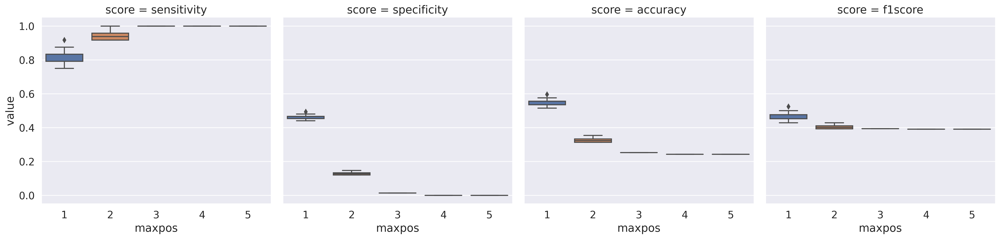

In [46]:
eval_dict = {'maxpos': [], 'sensitivity': [], 'specificity': [], 
                 'accuracy': [], 'f1score': [], 'cut-off metric': []}

# Loop over repetitions
for net in ig_evaluation_dict[50]:
    ranking_dict = get_ranking_dict(net)
    for i in range(5):
        # Absolute cut-off
        confmat = calculate_confusion_matrix(ranking_dict, abs_cutoff, identified_sum_species, 
                                             position=i)
        scores = all_scores(confmat, '', verbose=False)
        eval_dict['maxpos'].append(i+1)
        eval_dict['sensitivity'].append(scores['sensitivity'])
        eval_dict['specificity'].append(scores['specificity'])
        eval_dict['accuracy'].append(scores['accuracy'])
        eval_dict['f1score'].append(scores['f1score'])
        eval_dict['cut-off metric'].append('Absolute cut-off')
        
eval_df = pd.melt(pd.DataFrame(eval_dict), 
                      id_vars=['maxpos', 'cut-off metric'], 
                      value_vars=['sensitivity', 'specificity', 'accuracy', 'f1score'],
                      var_name='score')
sns.set(font_scale=1.3)
sns.catplot(
    data=eval_df, x='maxpos', y='value',
    col='score', kind='box'
)

#### Scoring cut-off

In [47]:
np.linspace(0,1, 11)

array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])

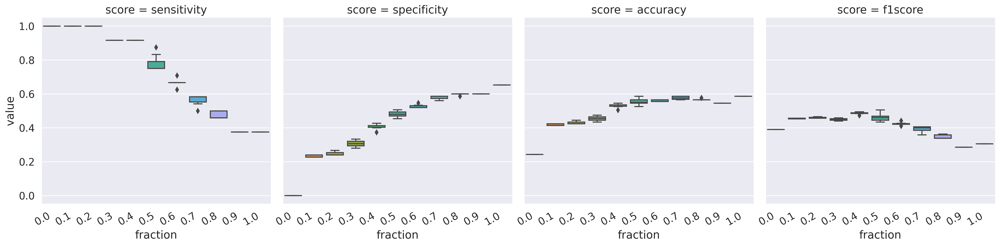

In [48]:
eval_dict = {'fraction': [], 'sensitivity': [], 'specificity': [], 
                 'accuracy': [], 'f1score': [], 'cut-off metric': []}

cos = [0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]

# Loop over repetitions
for net in ig_evaluation_dict[50]:
    ranking_dict = get_ranking_dict(net)
    for i in cos:
        # Absolute cut-off
        confmat = calculate_confusion_matrix(ranking_dict, scoring_cutoff, identified_sum_species, 
                                                 fraction=i)
        scores = all_scores(confmat, '', verbose=False)
        eval_dict['fraction'].append(str(i))
        eval_dict['sensitivity'].append(scores['sensitivity'])
        eval_dict['specificity'].append(scores['specificity'])
        eval_dict['accuracy'].append(scores['accuracy'])
        eval_dict['f1score'].append(scores['f1score'])
        eval_dict['cut-off metric'].append('Scoring cut-off')
        
eval_df = pd.melt(pd.DataFrame(eval_dict), 
                      id_vars=['fraction', 'cut-off metric'], 
                      value_vars=['sensitivity', 'specificity', 'accuracy', 'f1score'],
                      var_name='score')
eval_df['fraction'] = eval_df['fraction'].astype(str)

sns.set(font_scale=1.3)
g = sns.catplot(
    data=eval_df, x='fraction', y='value',
    col='score', kind='box', col_wrap=4
)

g.set_xticklabels(g.axes[0].get_xticklabels(), rotation=30, ha='right')

In [49]:
eval_df['fraction']

0      0.0
1      0.1
2      0.2
3      0.3
4      0.4
      ... 
435    0.6
436    0.7
437    0.8
438    0.9
439    1.0
Name: fraction, Length: 440, dtype: object

#### Random cut-off

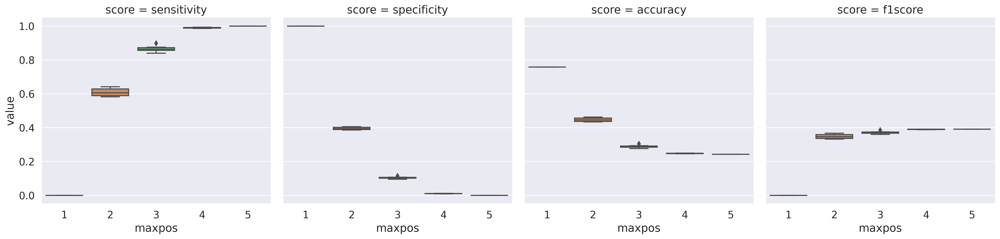

In [50]:
eval_dict = {'maxpos': [], 'sensitivity': [], 'specificity': [], 
                 'accuracy': [], 'f1score': [], 'cut-off metric': []}

# Loop over repetitions
for net in ig_evaluation_dict[50]:
    ranking_dict = get_ranking_dict(net)
    for i in range(5):
        # Absolute cut-off
        random_dict = {'sensitivity': [], 'specificity': [], 'accuracy': [],'f1score': []}
        for j in range(20):
            confmat = calculate_confusion_matrix(ranking_dict, randomly_picking, identified_sum_species, 
                                                 num=i)
            tmp = all_scores(confmat, 'Random', verbose=False)
            random_dict['sensitivity'].append(tmp['sensitivity'])
            random_dict['specificity'].append(tmp['specificity'])
            random_dict['accuracy'].append(tmp['accuracy'])
            random_dict['f1score'].append(tmp['f1score'])

        final_dict = {k: np.mean(v) for k, v in random_dict.items()}
        eval_dict['maxpos'].append(i+1)
        eval_dict['sensitivity'].append(final_dict['sensitivity'])
        eval_dict['specificity'].append(final_dict['specificity'])
        eval_dict['accuracy'].append(final_dict['accuracy'])
        eval_dict['f1score'].append(final_dict['f1score'])
        eval_dict['cut-off metric'].append('Random cut-off')
        
eval_df = pd.melt(pd.DataFrame(eval_dict), 
                      id_vars=['maxpos', 'cut-off metric'], 
                      value_vars=['sensitivity', 'specificity', 'accuracy', 'f1score'],
                      var_name='score')
sns.set(font_scale=1.3)
sns.catplot(
    data=eval_df, x='maxpos', y='value',
    col='score', kind='box'
)

#### Systematic

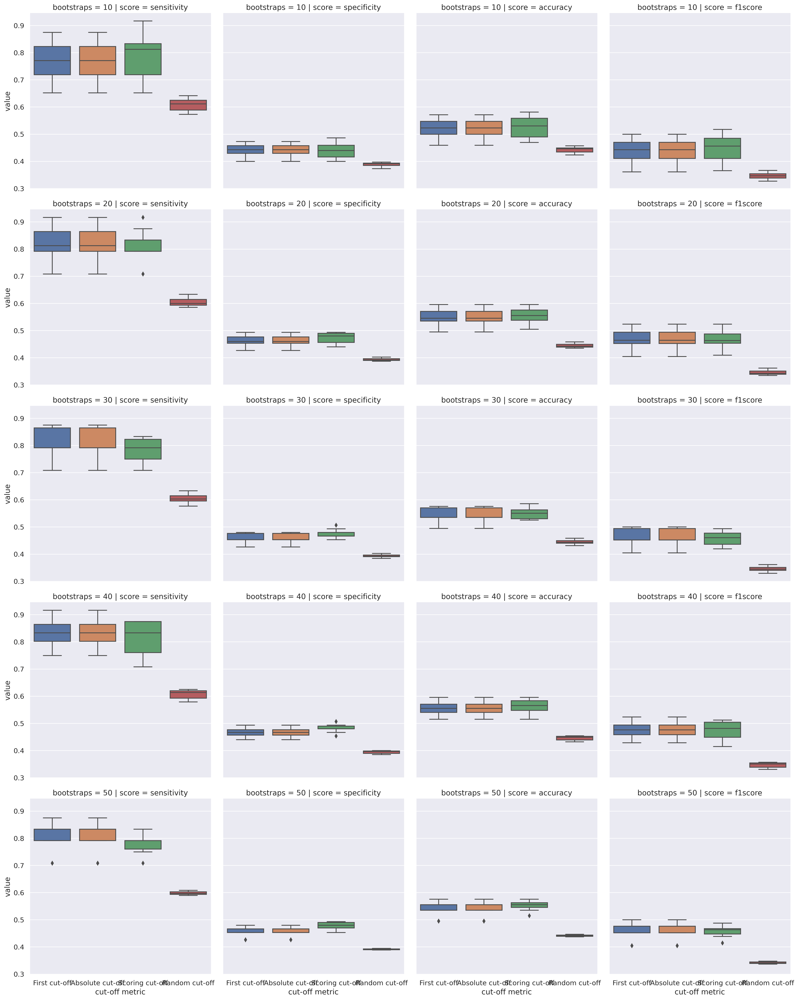

In [94]:
eval_df = eval_scores(ig_evaluation_dict, random_num=1, scoring_fraction=0.5, absolute_position=0)
sns.set(font_scale=1.1)
sns.catplot(
    data=eval_df, x='cut-off metric', y='value',
    col='score', row='bootstraps', kind='box'
)

0             Most likely
1             Most likely
2        50% of neighbors
3      Random 2 molecules
4             Most likely
              ...        
795    Random 2 molecules
796           Most likely
797           Most likely
798      50% of neighbors
799    Random 2 molecules
Name: cut-off metric, Length: 800, dtype: object

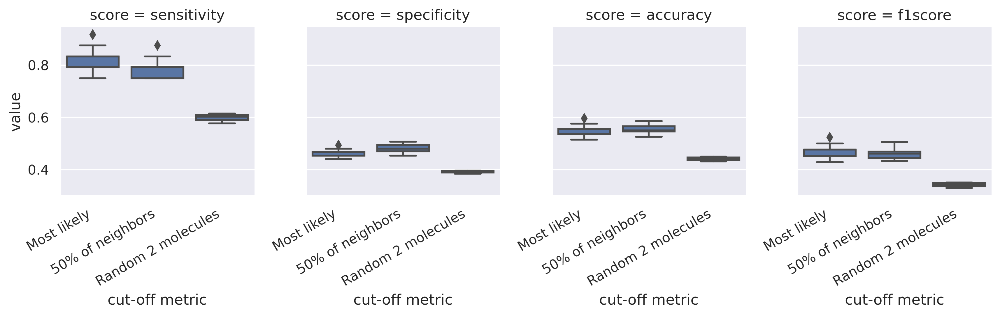

In [54]:
eval_df = eval_scores(ig_evaluation_dict, random_num=1, scoring_fraction=0.5, absolute_position=0)

eval_df['cut-off metric'] = eval_df['cut-off metric'].replace(
    ['First cut-off', 'Absolute cut-off', 'Scoring cut-off', 'Random cut-off'], 
    ['Most likely', 'Most likely', '50% of neighbors', 'Random 2 molecules'])

sns.set(font_scale=1.)
g = sns.FacetGrid(eval_df[eval_df['bootstraps']==50], col="score")
g.map_dataframe(sns.boxplot, x="cut-off metric", y="value")
g.set_xticklabels(g.axes[0][0].get_xticklabels(), rotation=30, ha='right')

In [113]:
eval_df = eval_scores(ig_evaluation_dict, random_num=1, scoring_fraction=0.5, absolute_position=0)

/tmp/ipykernel_5793/2168645834.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp['cut-off metric'] = tmp['cut-off metric'].replace('First cut-off', 'Network ranking')
/tmp/ipykernel_5793/2168645834.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp['cut-off metric'] = tmp['cut-off metric'].replace('Random cut-off', 'Random')


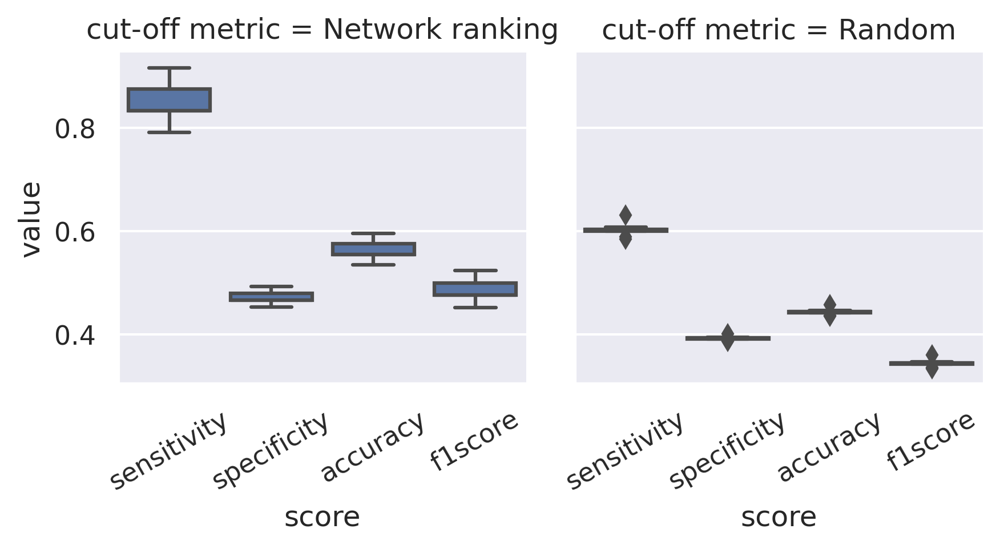

In [119]:
tmp = eval_df[eval_df['cut-off metric'].isin(['Random cut-off', 'First cut-off'])]
tmp['cut-off metric'] = tmp['cut-off metric'].replace('First cut-off', 'Network ranking')
tmp['cut-off metric'] = tmp['cut-off metric'].replace('Random cut-off', 'Random')

sns.set(font_scale=1.)
g = sns.FacetGrid(tmp[tmp['bootstraps']==50], col="cut-off metric")
g.map_dataframe(sns.boxplot, x="score", y="value")
g.set_xticklabels(g.axes[0][0].get_xticklabels(), rotation=30)

In [111]:
g.axes[0][0].get_xticklabels()

[Text(0, 0, 'sensitivity'),
 Text(1, 0, 'specificity'),
 Text(2, 0, 'accuracy'),
 Text(3, 0, 'f1score')]

In [112]:
eval_df = eval_scores(ig_evaluation_dict, random_num=1, scoring_fraction=0.5, absolute_position=0)


sns.catplot(
    data=eval_df, x='score', y='value',
    col='cut-off metric', row='bootstraps', kind='box'
)

## Weighted

### Ranking vs. identified in LC-MS

In [346]:
out_dict = {}

# K - ion, V - data
for k, v in dict(ig_sim.nodes(data=True)).items():
    sum_species = v['sum_species']
    # Get exemplary lipids for each sum species
    tmp_dict = {}
    for pos, ss, score in zip(range(len(sum_species)), sum_species.index, sum_species.values):
        # find a matching lipid
        for ll in v['parsed_lipids']:
            if ll.sum_species_str() == ss:
                break
        # Include only actually ranked lipids
        if not (sum_species==0).all():
            tmp_dict[ss] = {
                'relpos': scaling_position(pos, len(sum_species)), # FIX SCALING OF POSITIONS
                'abspos': pos,
                'score': score,
                'lipid': ll,
                'iseven': iseven(ll.sum_length()),
                'hasether': ll.get_ether()
                           }
    out_dict[k] = tmp_dict

# Evaluate
# Only for cases where even and odd chain lipid in annotation

conf_pos = []
nconf_pos = []

# Loop over all ions
for k, v in out_dict.items():
    
    # Loop over all ranked sum_species per ion
    for ss in v.keys():
        if ss in identified_sum_species:
            conf_pos.append(v[ss]['relpos'])
        else:
            nconf_pos.append(v[ss]['relpos'])
        
conf_df = pd.concat([pd.DataFrame({'pos': conf_pos, 'type': 'confirmed'}), 
                     pd.DataFrame({'pos': nconf_pos, 'type': 'not_confirmed'})]).reset_index()

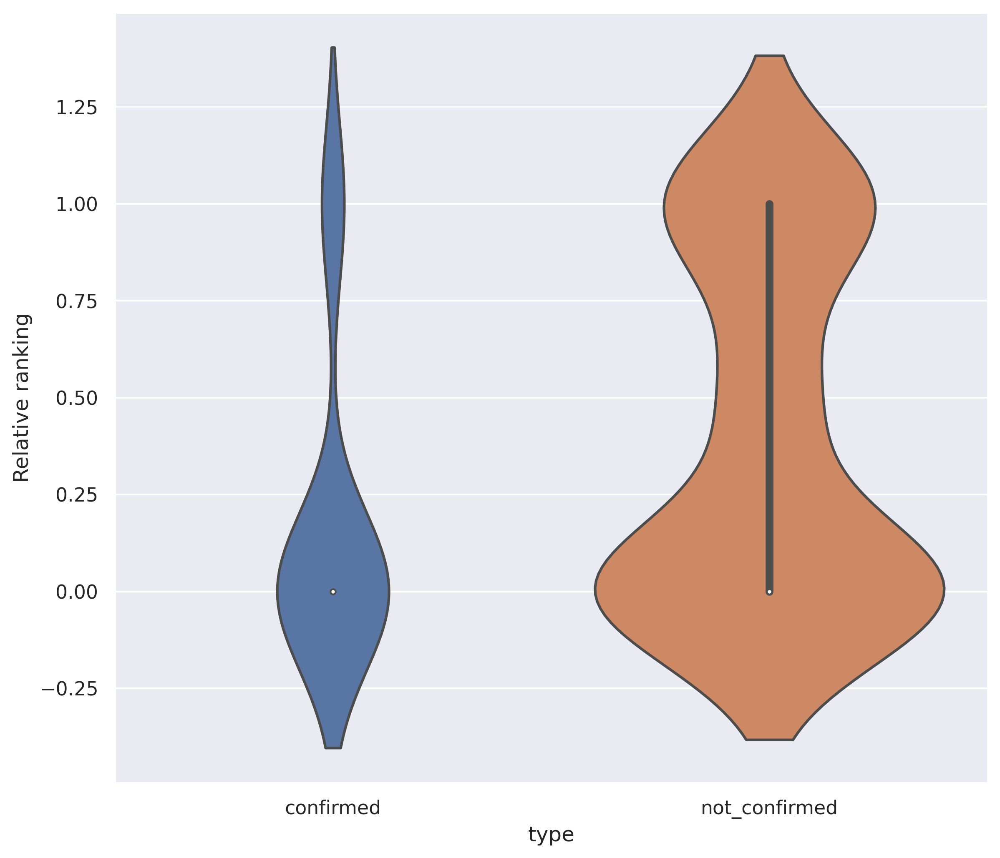

In [347]:
sns.violinplot(conf_df, x='type', y='pos', scale='count')
plt.ylabel('Relative ranking')
plt.show()

#### Only if lipid class was identified

In [348]:
# Evaluate
# Only for cases where even and odd chain lipid in annotation

conf_pos = []
nconf_pos = []

# Loop over all ions
for k, v in out_dict.items():
    
    # Loop over all ranked sum_species per ion
    for ss in v.keys():
        if v[ss]['lipid'].get_lipid_class() in identified_classes:
            if ss in identified_sum_species:
                conf_pos.append(v[ss]['relpos'])
            else:
                nconf_pos.append(v[ss]['relpos'])
        
conf_df_class = pd.concat([pd.DataFrame({'pos': conf_pos, 'type': 'confirmed'}), 
                     pd.DataFrame({'pos': nconf_pos, 'type': 'not_confirmed'})]).reset_index()

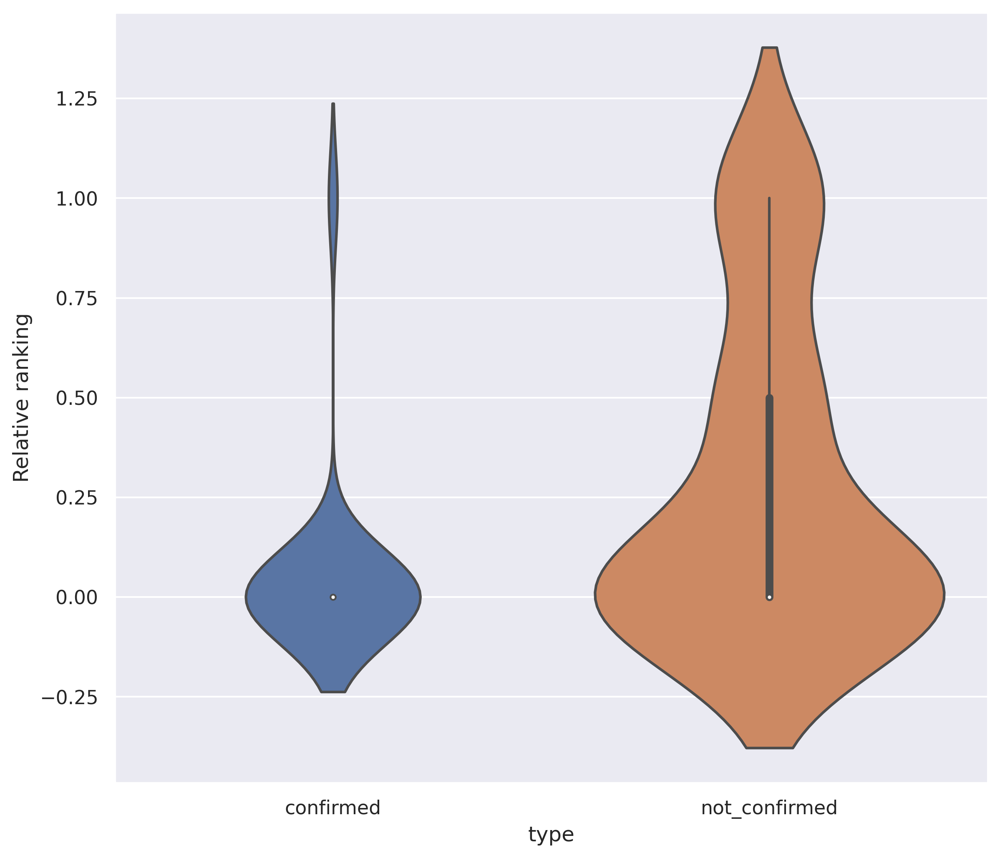

In [349]:
sns.violinplot(conf_df_class, x='type', y='pos', scale='count')
plt.ylabel('Relative ranking')
plt.show()

### Cut-off selection

#### Absolute cut-off

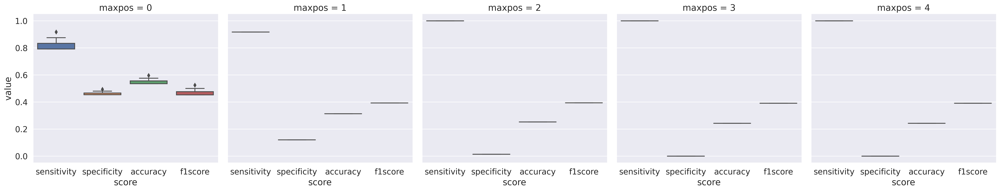

In [350]:
eval_dict = {'maxpos': [], 'sensitivity': [], 'specificity': [], 
                 'accuracy': [], 'f1score': [], 'cut-off metric': []}

# Loop over repetitions
for net in igw_evaluation_dict[50]:
    ranking_dict = get_ranking_dict(net)
    for i in range(5):
        # Absolute cut-off
        confmat = calculate_confusion_matrix(ranking_dict, abs_cutoff, identified_sum_species, 
                                             position=i)
        scores = all_scores(confmat, '', verbose=False)
        eval_dict['maxpos'].append(i)
        eval_dict['sensitivity'].append(scores['sensitivity'])
        eval_dict['specificity'].append(scores['specificity'])
        eval_dict['accuracy'].append(scores['accuracy'])
        eval_dict['f1score'].append(scores['f1score'])
        eval_dict['cut-off metric'].append('Absolute cut-off')
        
eval_df = pd.melt(pd.DataFrame(eval_dict), 
                      id_vars=['maxpos', 'cut-off metric'], 
                      value_vars=['sensitivity', 'specificity', 'accuracy', 'f1score'],
                      var_name='score')
sns.set(font_scale=1.3)
sns.catplot(
    data=eval_df, x='score', y='value',
    col='maxpos', kind='box'
)

#### Scoring cut-off

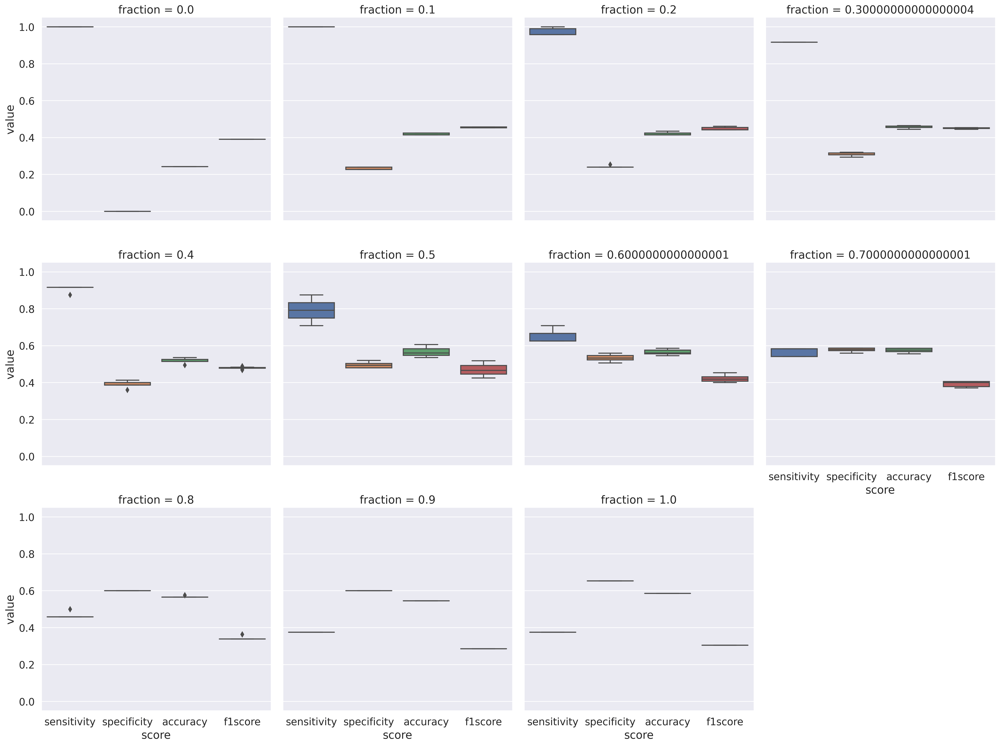

In [351]:
eval_dict = {'fraction': [], 'sensitivity': [], 'specificity': [], 
                 'accuracy': [], 'f1score': [], 'cut-off metric': []}

# Loop over repetitions
for net in igw_evaluation_dict[50]:
    ranking_dict = get_ranking_dict(net)
    for i in np.linspace(0,1, 11):
        # Absolute cut-off
        confmat = calculate_confusion_matrix(ranking_dict, scoring_cutoff, identified_sum_species, 
                                                 fraction=i)
        scores = all_scores(confmat, '', verbose=False)
        eval_dict['fraction'].append(i)
        eval_dict['sensitivity'].append(scores['sensitivity'])
        eval_dict['specificity'].append(scores['specificity'])
        eval_dict['accuracy'].append(scores['accuracy'])
        eval_dict['f1score'].append(scores['f1score'])
        eval_dict['cut-off metric'].append('Scoring cut-off')
        
eval_df = pd.melt(pd.DataFrame(eval_dict), 
                      id_vars=['fraction', 'cut-off metric'], 
                      value_vars=['sensitivity', 'specificity', 'accuracy', 'f1score'],
                      var_name='score')
sns.set(font_scale=1.3)
sns.catplot(
    data=eval_df, x='score', y='value',
    col='fraction', kind='box', col_wrap=4
)

#### Random cut-off

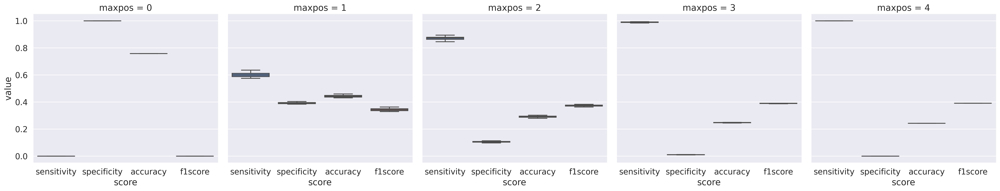

In [352]:
eval_dict = {'maxpos': [], 'sensitivity': [], 'specificity': [], 
                 'accuracy': [], 'f1score': [], 'cut-off metric': []}

# Loop over repetitions
for net in igw_evaluation_dict[50]:
    ranking_dict = get_ranking_dict(net)
    for i in range(5):
        # Absolute cut-off
        random_dict = {'sensitivity': [], 'specificity': [], 'accuracy': [],'f1score': []}
        for j in range(20):
            confmat = calculate_confusion_matrix(ranking_dict, randomly_picking, identified_sum_species, 
                                                 num=i)
            tmp = all_scores(confmat, 'Random', verbose=False)
            random_dict['sensitivity'].append(tmp['sensitivity'])
            random_dict['specificity'].append(tmp['specificity'])
            random_dict['accuracy'].append(tmp['accuracy'])
            random_dict['f1score'].append(tmp['f1score'])

        final_dict = {k: np.mean(v) for k, v in random_dict.items()}
        eval_dict['maxpos'].append(i)
        eval_dict['sensitivity'].append(final_dict['sensitivity'])
        eval_dict['specificity'].append(final_dict['specificity'])
        eval_dict['accuracy'].append(final_dict['accuracy'])
        eval_dict['f1score'].append(final_dict['f1score'])
        eval_dict['cut-off metric'].append('Random cut-off')
        
eval_df = pd.melt(pd.DataFrame(eval_dict), 
                      id_vars=['maxpos', 'cut-off metric'], 
                      value_vars=['sensitivity', 'specificity', 'accuracy', 'f1score'],
                      var_name='score')
sns.set(font_scale=1.3)
sns.catplot(
    data=eval_df, x='score', y='value',
    col='maxpos', kind='box'
)

#### Systematic

In [353]:
eval_df = eval_scores(igw_evaluation_dict, random_num=1, scoring_fraction=0.5, absolute_position=0)
sns.set(font_scale=1.1)
sns.catplot(
    data=eval_df, x='score', y='value',
    col='cut-off metric', row='bootstraps', kind='box'
)

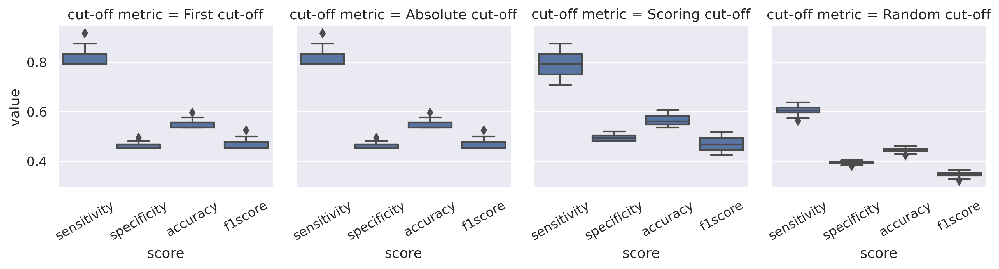

In [354]:
eval_df = eval_scores(igw_evaluation_dict, random_num=1, scoring_fraction=0.5, absolute_position=0)

eval_df[eval_df['bootstraps']==50]
sns.set(font_scale=1.)
g = sns.FacetGrid(eval_df[eval_df['bootstraps']==50], col="cut-off metric")
g.map_dataframe(sns.boxplot, x="score", y="value")
g.set_xticklabels(g.axes[0][0].get_xticklabels(), rotation=30)

## Abundance of lipids

Evalualte how abundances of bulk and sc data compares for the ranking

In [323]:
mean_neg = bulk_neg.set_index('sum_species')[[x for x in bulk_neg.columns if 
                                              x.startswith('Luca140818')]].groupby(level=0).sum().mean(axis=1)
mean_pos = bulk_pos.set_index('sum_species')[[x for x in bulk_pos.columns if 
                                              x.startswith('Luca140818')]].groupby(level=0).sum().mean(axis=1)